In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import sys
import os
_stderr = sys.stderr
# null = open(os.devnull,'wb')
sys.version

'3.7.4 (default, Sep 11 2019, 11:24:51) \n[GCC 6.2.0]'

In [2]:
# Working directory containing DRG snATAC-seq and snRNA-seq data
work_dir = '/n/scratch3/users/x/xl266/scenic_plus/nucleus_accumbens_Mar25/'
tmp_dir = '/n/scratch3/users/x/xl266/tmp'

In [3]:
#make a directory for to store the processed scRNA-seq data.
if not os.path.exists(os.path.join(work_dir, 'scRNA')):
    os.makedirs(os.path.join(work_dir, 'scRNA'))

# Read in RNA AnnData

In [5]:
# Read in AnnData using scanpy
anndata_path = "/n/scratch3/users/p/pab1164/NAc/NAc_IdentsStored_MuSeurat.h5ad"
import scanpy as sc
adata = sc.read_h5ad(anndata_path)


In [6]:
adata

AnnData object with n_obs × n_vars = 41433 × 26145
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'percent.mito', 'Sample', 'tree.ident', 'Celltype', 'L2_clustering', 'RNA_snn_res.0.2', 'seurat_clusters', 'percent.Hbb', 'Identities'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable'
    layers: 'counts'

In [43]:
adata.obs['Identities'].value_counts()

D1_Alpha            9095
Oligodendrocytes    8300
D2_MSNs             7764
Astrocytes          7405
Microglia           3030
OPC                 3025
D1_Beta             2814
Name: Identities, dtype: int64

# ATAC

In [9]:
if not os.path.exists(os.path.join(work_dir, 'scATAC')):
    os.makedirs(os.path.join(work_dir, 'scATAC'))

In [145]:
import pandas as pd
pd.__version__

'1.3.5'

In [32]:
import pandas as pd
nucl_acc_atac_metadata_path = '/n/scratch3/users/x/xl266/scenic_plus/nucleus_accumbens_Mar25/data/nucleus_accumbens_metadata.csv'

In [33]:
nucl_acc_metadata_anchored_atac = pd.read_csv(nucl_acc_atac_metadata_path, index_col=0)
nucl_acc_metadata_anchored_atac

,orig.ident,nCount_peaks,nFeature_peaks,TSS_fragments,DNase_sensitive_region_fragments,enhancer_region_fragments,promoter_region_fragments,on_target_fragments,blacklist_region_fragments,peak_region_fragments,...,peaks_snn_res.0.3,peaks_snn_res.0.4,Identities,annotation_correct,seurat_annotations,cutoff_bool,nCount_macs2_peaks,nFeature_macs2_peaks,counts_in_macs2_peaks,sample_name
AAACGAAAGAGAATTC-2,ATAC,8154,4018,3522,6145,3679,2428,8764,49,4515,...,1,1,D1_Alpha,False,Mixed,True,4275,3975,4299,Sample2
AAACGAAAGTCCCTCT-1,ATAC,5833,2783,1809,3338,1669,1524,4216,12,3077,...,1,1,D2_MSNs,False,Mixed,True,3067,2830,3024,Sample1
AAACGAACAACACGGA-1,ATAC,7384,3600,2476,4471,2452,2044,5900,12,4001,...,4,5,D1_Beta,False,Mixed_2,True,3892,3598,3844,Sample1
AAACGAACACCTGAAT-1,ATAC,14526,6605,4240,7591,3989,3499,9790,31,7770,...,0,0,D2_MSNs,False,D1_D2,True,7654,6763,7580,Sample1
AAACGAACAGGGAGTT-2,ATAC,10961,5090,3758,6406,3308,3178,8181,43,5891,...,5,6,Oligodendrocytes,True,Oligodendrocytes,True,5651,5061,5516,Sample2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTAGGTGAACC-1,ATAC,6666,3140,2832,4396,2148,2452,5718,16,3573,...,6,9,Microglia,True,Microglia,True,3428,3115,3336,Sample1
TTTGTGTCAACGACAG-2,ATAC,8106,3985,4405,7362,4906,2918,11164,15,4530,...,0,0,D1_Alpha,False,D1_D2,True,4123,3799,4137,Sample2
TTTGTGTCATGGAGGT-1,ATAC,6527,3229,2123,3830,2062,1735,4963,16,3522,...,0,0,D2_MSNs,False,D1_D2,True,3431,3225,3414,Sample1
TTTGTGTTCACTACCC-2,ATAC,5771,2876,1838,3154,1628,1483,4082,12,3120,...,0,0,D2_MSNs,False,D1_D2,True,3039,2881,3035,Sample2


In [36]:
cell_data = pd.DataFrame(nucl_acc_metadata_anchored_atac['Identities'])
cell_data['sample_id'] = 'nucl_acc'
cell_data

,Identities,sample_id
AAACGAAAGAGAATTC-2,D1_Alpha,nucl_acc
AAACGAAAGTCCCTCT-1,D2_MSNs,nucl_acc
AAACGAACAACACGGA-1,D1_Beta,nucl_acc
AAACGAACACCTGAAT-1,D2_MSNs,nucl_acc
AAACGAACAGGGAGTT-2,Oligodendrocytes,nucl_acc
...,...,...
TTTGTGTAGGTGAACC-1,Microglia,nucl_acc
TTTGTGTCAACGACAG-2,D1_Alpha,nucl_acc
TTTGTGTCATGGAGGT-1,D2_MSNs,nucl_acc
TTTGTGTTCACTACCC-2,D2_MSNs,nucl_acc


In [38]:
set(cell_data['Identities'])

{'Astrocytes',
 'D1_Alpha',
 'D1_Beta',
 'D2_MSNs',
 'Microglia',
 'OPC',
 'Oligodendrocytes'}

In [ ]:
# Get chromosome sizes
import pyranges as pr
import requests
import pandas as pd

# TODO: use mm10 link
target_url='https://hgdownload.soe.ucsc.edu/goldenPath/mm10/bigZips/mm10.chrom.sizes'

chromsizes=pd.read_csv(target_url, sep='\t', header=None)
chromsizes.columns=['Chromosome', 'End']
chromsizes['Start']=[0]*chromsizes.shape[0]
chromsizes=chromsizes.loc[:,['Chromosome', 'Start', 'End']]
chromsizes

# CisTopic

In [ ]:
bc_passing_filters = {'nucl_acc':[]}
bc_passing_filters['nucl_acc'] = list(set(cell_data.index))

In [ ]:
# Load ATAC data
import pickle
fragments_path = '/n/scratch3/users/p/pab1164/NAc/fragments.tsv.gz'
fragments_dict = {'nucl_acc': os.path.join(work_dir, 'data/fragments.tsv.gz')}
path_to_regions = {'nucl_acc':os.path.join(work_dir, 'scATAC/nucl_acc_peaks_atac.bed')}
path_to_blacklist= os.path.join(work_dir, 'data/mm10-blacklist.v2.bed')

# Creating a cisTopic object and topic modeling

In [ ]:
# Create CisTopic object
from pycisTopic.cistopic_class import *
key = 'nucl_acc'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments=fragments_dict[key],
                            path_to_regions=path_to_regions[key],
                            path_to_blacklist=path_to_blacklist,
                            valid_bc=list(set(bc_passing_filters[key])),  # deleted ' & set(scRNA_bc)', 'metrics = '
                            n_cpu=1,
                            project=key,
                            split_pattern='-')
cistopic_obj.add_cell_data(cell_data, split_pattern='-')
print(cistopic_obj)

In [ ]:
# Save CisTopic object
pickle.dump(cistopic_obj,
            open(os.path.join(work_dir, 'scATAC/nucl_acc_cistopic_obj.pkl'), 'wb'))

# Topic modeling

In [ ]:
import pickle
cistopic_obj = pickle.load(open(os.path.join(work_dir, 'scATAC/nucl_acc_cistopic_obj.pkl'), 'rb'))
from pycisTopic.cistopic_class import *
models=run_cgs_models(cistopic_obj,
                    n_topics=[2,4,10,16,32,48],
                    n_cpu=5,
                    n_iter=500,
                    random_state=555,
                    alpha=50,
                    alpha_by_topic=True,
                    eta=0.1,
                    eta_by_topic=False,
                    save_path=None,
                    _temp_dir = os.path.join(tmp_dir + 'ray_spill'))

In [ ]:
# Save topic modeling results

if not os.path.exists(os.path.join(work_dir, 'scATAC/models')):
    os.makedirs(os.path.join(work_dir, 'scATAC/models'))

pickle.dump(models,
            open(os.path.join(work_dir, 'scATAC/models/nucl_acc_models_500_iter_LDA.pkl'), 'wb'))

In [ ]:
# Evaluate models
models = pickle.load(open(os.path.join(work_dir, 'scATAC/models/nucl_acc_models_500_iter_LDA.pkl'), 'rb'))
cistopic_obj = pickle.load(open(os.path.join(work_dir, 'scATAC/nucl_acc_cistopic_obj.pkl'), 'rb'))
from pycisTopic.lda_models import *

# Let pycisTopic pick the optimal number of topics. In this case, 32
model = evaluate_models(models,
                       select_model=None,
                       return_model=True,
                       metrics=['Arun_2010','Cao_Juan_2009', 'Minmo_2011', 'loglikelihood'],
                       plot_metrics=False,
                       save = os.path.join(work_dir, 'scATAC/models/evaluation.pdf'))

In [ ]:
# Add chosen model to cistopic object
cistopic_obj.add_LDA_model(model)
pickle.dump(cistopic_obj,
            open(os.path.join(work_dir, 'scATAC/nucl_acc_cistopic_obj.pkl'), 'wb'))

In [25]:
# If needed; used Mar 29 to replot UMAP w/o labels
import pickle
import dill
cistopic_obj = dill.load(open(os.path.join(work_dir, 'scATAC/nucl_acc_cistopic_obj.pkl'), 'rb'))



In [26]:
# Visualize topics
from pycisTopic.clust_vis import *
run_umap(cistopic_obj, target  = 'cell', scale=True)

In [3]:
import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=100, frameon=False, figsize=(5, 5), facecolor='white')


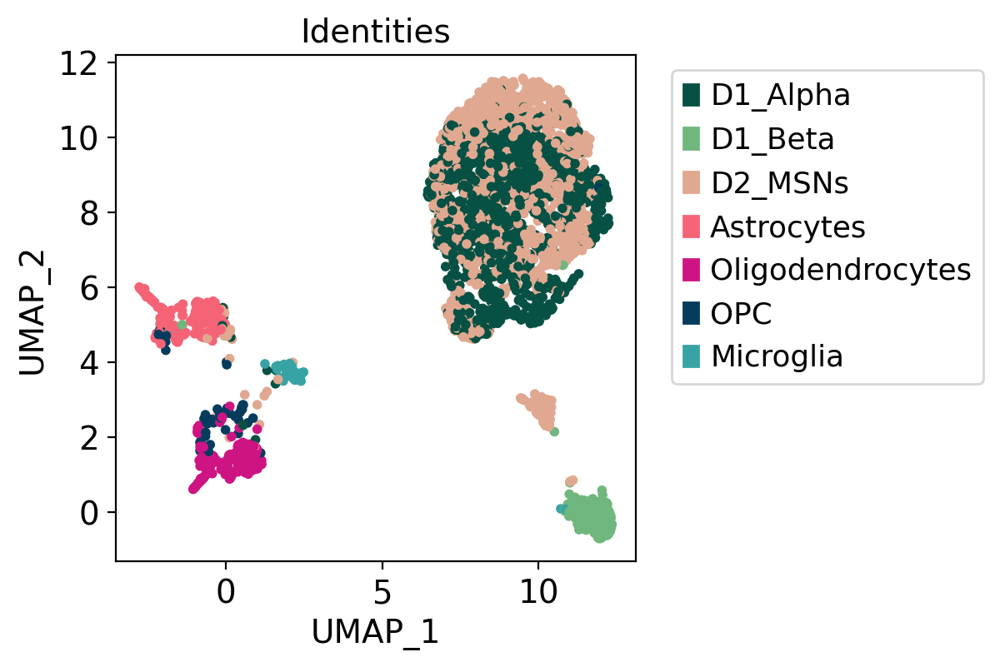

In [32]:
from pycisTopic.clust_vis import *

color_dict_specs = {
    'D1_Alpha': "#065143",
    'D1_Beta': "#70B77E",
    'D2_MSNs': "#E0A890",
    'Astrocytes': "#F56476",
    'Oligodendrocytes': "#CE1483",
    'OPC': "#053C5E" ,
    'Microglia': "#38A3A5",
}

color_dict = {}
color_dict['Identities'] = color_dict_specs

figure_size = (4, 4)


# Edited (one line) of plot_metadata() from clust_vis.py
# plot_cistopic_metadata_no_grid(cistopic_obj, reduction_name = 'UMAP', variables = ['Identities'], show_label = False, show_legend=True, figsize=figure_size, color_dictionary=color_dict)

plot_cistopic_metadata_no_grid(cistopic_obj, reduction_name = 'UMAP', variables = ['Identities'], show_label = False, show_legend=True, figsize=figure_size, color_dictionary=color_dict,
             save = os.path.join('/n/scratch3/users/x/xl266/nucleus_accumbens_final_plots/fig_s2', 'topics_umap_nolabels_nogrid_newcolors.pdf'))




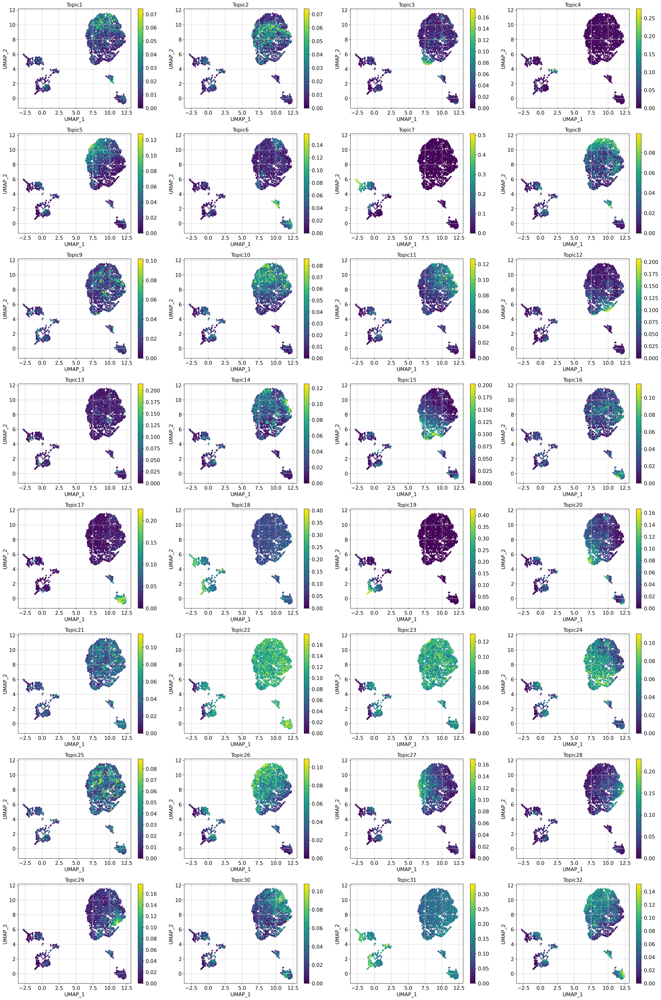

In [8]:
# plot cell-topic probabilities
plot_topic(cistopic_obj, reduction_name = 'UMAP', num_columns = 4, save = os.path.join(work_dir, 'scATAC/topics_cell_topic_prob_umap.pdf'))

# Inferring candidate enhancer regions

In [ ]:
import pickle
from pycisTopic.topic_binarization import *
region_bin_topics_otsu = binarize_topics(cistopic_obj, method='otsu')
region_bin_topics_top3k = binarize_topics(cistopic_obj, method='ntop', ntop = 3000)

In [ ]:
# Calculate DARs per celltype
from pycisTopic.diff_features import *
imputed_acc_obj = impute_accessibility(cistopic_obj, selected_cells=None, selected_regions=None, scale_factor=10**6)
normalized_imputed_acc_obj = normalize_scores(imputed_acc_obj, scale_factor=10**4)
variable_regions = find_highly_variable_features(normalized_imputed_acc_obj, plot = False)
markers_dict = find_diff_features(cistopic_obj, imputed_acc_obj, variable='Identities', var_features=variable_regions, split_pattern = '-')

In [ ]:
# Save results
if not os.path.exists(os.path.join(work_dir, 'scATAC/candidate_enhancers')):
    os.makedirs(os.path.join(work_dir, 'scATAC/candidate_enhancers'))
import pickle
pickle.dump(region_bin_topics_otsu, open(os.path.join(work_dir, 'scATAC/candidate_enhancers/region_bin_topics_otsu.pkl'), 'wb'))
pickle.dump(region_bin_topics_top3k, open(os.path.join(work_dir, 'scATAC/candidate_enhancers/region_bin_topics_top3k.pkl'), 'wb'))
pickle.dump(markers_dict, open(os.path.join(work_dir, 'scATAC/candidate_enhancers/markers_dict.pkl'), 'wb'))

# Motif enrichment analysis using pycistarget

In [ ]:
# Load candidate enhancers
import pickle
region_bin_topics_otsu = pickle.load(open(os.path.join(work_dir, 'scATAC/candidate_enhancers/region_bin_topics_otsu.pkl'), 'rb'))
region_bin_topics_top3k = pickle.load(open(os.path.join(work_dir, 'scATAC/candidate_enhancers/region_bin_topics_top3k.pkl'), 'rb'))
markers_dict = pickle.load(open(os.path.join(work_dir, 'scATAC/candidate_enhancers/markers_dict.pkl'), 'rb'))

In [ ]:
# Convert to dictionary of pyranges objects
import pyranges as pr
from pycistarget.utils import region_names_to_coordinates
region_sets = {}
region_sets['topics_otsu'] = {}
region_sets['topics_top_3'] = {}
region_sets['DARs'] = {}
for topic in region_bin_topics_otsu.keys():
    regions = region_bin_topics_otsu[topic].index[region_bin_topics_otsu[topic].index.str.startswith('chr')] #only keep regions on known chromosomes
    region_sets['topics_otsu'][topic] = pr.PyRanges(region_names_to_coordinates(regions))
for topic in region_bin_topics_top3k.keys():
    regions = region_bin_topics_top3k[topic].index[region_bin_topics_top3k[topic].index.str.startswith('chr')] #only keep regions on known chromosomes
    region_sets['topics_top_3'][topic] = pr.PyRanges(region_names_to_coordinates(regions))
for DAR in markers_dict.keys():
    regions = markers_dict[DAR].index[markers_dict[DAR].index.str.startswith('chr')] #only keep regions on known chromosomes
    region_sets['DARs'][DAR] = pr.PyRanges(region_names_to_coordinates(regions))

In [ ]:
for key in region_sets.keys():
    print(f'{key}: {region_sets[key].keys()}')

In [ ]:
motif_annotation = '/n/scratch3/users/x/xl266/scenic_plus/drg_atac_rna_v2/data/motif_data_scenic/motifs-v10nr_clust-nr.mgi-m0.001-o0.0.tbl'
encode_db_scores_path = '/n/scratch3/users/x/xl266/scenic_plus/drg_atac_rna_v2/data/motif_data_scenic/mm10_screen_v10_clust.regions_vs_motifs.scores.feather'
encode_db_rankings_path = '/n/scratch3/users/x/xl266/scenic_plus/drg_atac_rna_v2/data/motif_data_scenic/mm10_screen_v10_clust.regions_vs_motifs.rankings.feather'

In [ ]:
if not os.path.exists(os.path.join(work_dir, 'motifs')):
    os.makedirs(os.path.join(work_dir, 'motifs'))

In [ ]:
from scenicplus.wrappers.run_pycistarget import run_pycistarget
run_pycistarget(
    region_sets = region_sets,
    species = 'mus_musculus',
    save_path = os.path.join(work_dir, 'motifs'),
    ctx_db_path = renamed_db_rankings_path,  # using renamed version (columns are region strings)
    dem_db_path = renamed_db_scores_path,    # using renamed version (columns are region strings)
    annotation = ['Direct_annot', 'Orthology_annot', 'Motif_similarity_annot', 'Motif_similarity_and_Orthology_annot'],    # Added Mar 19, 2023
    path_to_motif_annotations = motif_annotation,
    run_without_promoters = True,
    n_cpu = 12,
    _temp_dir = os.path.join(tmp_dir, 'ray_spill'),
    annotation_version = 'v10nr_clust'
    )

# inferring enhancer-driven Gene Regulatory Networks (eGRNs) using SCENIC+

In [4]:
import dill
import scanpy as sc
import os
import warnings
warnings.filterwarnings("ignore")
import pandas
import pyranges

anndata_path = '/n/scratch3/users/p/pab1164/NAc/NAc_scRNA_MuSeuratDiet.h5ad'
adata = sc.read_h5ad(anndata_path)    
cistopic_obj = dill.load(open(os.path.join(work_dir, 'scATAC/nucl_acc_cistopic_obj.pkl'), 'rb'))
menr = dill.load(open(os.path.join(work_dir, 'motifs/menr.pkl'), 'rb'))

# Mar 22, 2023: the .X slot of reclustered AnnData is actually normalized, so we replace w/ raw counts sparse matrix
adata.X = adata.layers['counts'].copy()
adata.raw = adata

In [ ]:
# Set stderr to null to avoid strange messages from ray
import sys
_stderr = sys.stderr
null = open(os.devnull,'wb')

In [ ]:
from scenicplus.scenicplus_class import create_SCENICPLUS_object
import numpy as np
import scipy as sp

scplus_obj = create_SCENICPLUS_object(
    GEX_anndata = adata.raw.to_adata(),
    cisTopic_obj = cistopic_obj,
    menr = menr,
    multi_ome_mode = False,
    key_to_group_by = 'Identities'
)

scplus_obj.X_EXP = sp.sparse.csr_matrix(scplus_obj.X_EXP)
scplus_obj.X_EXP = np.array(scplus_obj.X_EXP.todense())

In [ ]:
# check with which biomart host our gene names match best

ensembl_version_dict = {'105': 'http://www.ensembl.org',
                        '104': 'http://may2021.archive.ensembl.org/',
                        '103': 'http://feb2021.archive.ensembl.org/',
                        '102': 'http://nov2020.archive.ensembl.org/',
                        '101': 'http://aug2020.archive.ensembl.org/',
                        '100': 'http://apr2020.archive.ensembl.org/',
                        '99': 'http://jan2020.archive.ensembl.org/',
                        '98': 'http://sep2019.archive.ensembl.org/',
                        '97': 'http://jul2019.archive.ensembl.org/',
                        '96': 'http://apr2019.archive.ensembl.org/',
                        '95': 'http://jan2019.archive.ensembl.org/',
                        '94': 'http://oct2018.archive.ensembl.org/',
                        '93': 'http://jul2018.archive.ensembl.org/',
                        '92': 'http://apr2018.archive.ensembl.org/',
                        '91': 'http://dec2017.archive.ensembl.org/',
                        '90': 'http://aug2017.archive.ensembl.org/',
                        '89': 'http://may2017.archive.ensembl.org/',
                        '88': 'http://mar2017.archive.ensembl.org/',
                        '87': 'http://dec2016.archive.ensembl.org/',
                        '86': 'http://oct2016.archive.ensembl.org/',
                        '80': 'http://may2015.archive.ensembl.org/',
                        '77': 'http://oct2014.archive.ensembl.org/',
                        '75': 'http://feb2014.archive.ensembl.org/',
                        '54': 'http://may2009.archive.ensembl.org/'}

import pybiomart as pbm
def test_ensembl_host(scplus_obj, host, species):
    dataset = pbm.Dataset(name=species+'_gene_ensembl',  host=host)
    annot = dataset.query(attributes=['chromosome_name', 'transcription_start_site', 'strand', 'external_gene_name', 'transcript_biotype'])
    annot.columns = ['Chromosome', 'Start', 'Strand', 'Gene', 'Transcript_type']
    annot['Chromosome'] = annot['Chromosome'].astype('str')
    filter = annot['Chromosome'].str.contains('CHR|GL|JH|MT')
    annot = annot[~filter]
    annot.columns=['Chromosome', 'Start', 'Strand', 'Gene', 'Transcript_type']
    gene_names_release = set(annot['Gene'].tolist())
    ov=len([x for x in scplus_obj.gene_names if x in gene_names_release])
    print('Genes recovered: ' + str(ov) + ' out of ' + str(len(scplus_obj.gene_names)))
    return ov

n_overlap = {}
for version in ensembl_version_dict.keys():
    print(f'host: {version}')
    try:
        n_overlap[version] =  test_ensembl_host(scplus_obj, ensembl_version_dict[version], 'mmusculus')
    except:
        print('Host not reachable')
v = sorted(n_overlap.items(), key=lambda item: item[1], reverse=True)[0][0]
print(f"version: {v} has the largest overlap, use {ensembl_version_dict[v]} as biomart host")

In [ ]:
biomart_host = str(ensembl_version_dict[v])

In [ ]:
from scenicplus.wrappers.run_scenicplus import run_scenicplus

# TF file from https://resources.aertslab.org/cistarget/tf_lists/allTFs_mm.txt
# import ray
# ray.shutdown()

# Only use save_partial = True if you are running from the very beginning / earlier in the pipeline.
# Otherwise, scenicplus will resave the entire object (takes time) at every if save_partial statement

bedToBigBed_dir = '/n/scratch3/users/x/xl266/scenic_plus/drg_atac_rna_v2/'
         
try:
    run_scenicplus(
        scplus_obj = scplus_obj,
        variable = ['Identities'],
        species = 'mmusculus',
        assembly = 'mm10',
        tf_file = '/n/scratch3/users/x/xl266/scenic_plus/drg_atac_rna/data/allTFs_mm.txt',
        save_path = os.path.join(work_dir, 'scenicplus'),
        biomart_host = biomart_host,
        upstream = [1000, 150000],
        downstream = [1000, 150000],
        calculate_TF_eGRN_correlation = True,
        calculate_DEGs_DARs = True,
        export_to_loom_file = False,   # unresolved bug was manually fixed by changing to correct scikit-learn function name (should've been fixed after Github post)
        export_to_UCSC_file = True,
        path_bedToBigBed = bedToBigBed_dir,
        n_cpu = 20,
#         save_partial = True,   # Actually, this might be redundant given the exception statement below
        _temp_dir = os.path.join(tmp_dir, 'ray_spill'))
except Exception as e:
    #in case of failure, still save the object
    dill.dump(scplus_obj, open(os.path.join(work_dir, 'scenicplus/scplus_obj.pkl'), 'wb'), protocol=-1)
    raise(e)

# Plotting

In [3]:
import os
save_dir = '/n/scratch3/users/x/xl266/nucleus_accumbens_final_plots/'

In [5]:
import scenicplus
scenicplus.__version__

'0.1.dev446+g5cf2469'

In [6]:
import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 5), facecolor='white')




In [3]:
# Load SCENIC+ results
import dill
scplus_obj = dill.load(open(os.path.join(work_dir, 'scenicplus/scplus_obj.pkl'), 'rb'))
scplus_obj

SCENIC+ object with n_cells x n_genes = 688 x 26145 and n_cells x n_regions = 688 x 96174
	metadata_regions:'Chromosome', 'Start', 'End', 'Width', 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc'
	metadata_genes:'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'highly_variable'
	metadata_cell:'Identities'
	menr:'CTX_topics_otsu_All', 'CTX_topics_otsu_No_promoters', 'DEM_topics_otsu_All', 'DEM_topics_otsu_No_promoters', 'CTX_topics_top_3_All', 'CTX_topics_top_3_No_promoters', 'DEM_topics_top_3_All', 'DEM_topics_top_3_No_promoters', 'CTX_DARs_All', 'CTX_DARs_No_promoters', 'DEM_DARs_All', 'DEM_DARs_No_promoters'
	dr_cell:'eRegulons_UMAP', 'eRegulons_tSNE'

In [4]:
scplus_obj.cell_names

Index(['Astrocytes.0', 'Astrocytes.1', 'Astrocytes.2', 'Astrocytes.3',
       'Astrocytes.4', 'Astrocytes.5', 'Astrocytes.6', 'Astrocytes.7',
       'Astrocytes.8', 'Astrocytes.9',
       ...
       'Oligodendrocytes.38', 'Oligodendrocytes.39', 'Oligodendrocytes.40',
       'Oligodendrocytes.41', 'Oligodendrocytes.42', 'Oligodendrocytes.43',
       'Oligodendrocytes.44', 'Oligodendrocytes.45', 'Oligodendrocytes.46',
       'Oligodendrocytes.47'],
      dtype='object', length=688)

In [5]:
# Sanity check
scplus_obj.metadata_cell['Identities'].value_counts()

D2_MSNs             270
D1_Alpha            248
Astrocytes           54
Oligodendrocytes     48
D1_Beta              44
Microglia            12
OPC                  12
Name: Identities, dtype: int64

In [6]:
# Simplify and filter output
from scenicplus.preprocessing.filtering import apply_std_filtering_to_eRegulons
apply_std_filtering_to_eRegulons(scplus_obj)

Only keeping positive R2G
Only keep extended if not direct
Getting signatures...
Simplifying eRegulons ...


In [7]:
# eRegulon enrichment scores
from scenicplus.eregulon_enrichment import score_eRegulons
region_ranking = dill.load(open(os.path.join(work_dir, 'scenicplus/region_ranking.pkl'), 'rb')) #load ranking calculated using the wrapper function
gene_ranking = dill.load(open(os.path.join(work_dir, 'scenicplus/gene_ranking.pkl'), 'rb')) #load ranking calculated using the wrapper function
score_eRegulons(scplus_obj,
                ranking = region_ranking,
                eRegulon_signatures_key = 'eRegulon_signatures_filtered',
                key_added = 'eRegulon_AUC_filtered',
                enrichment_type= 'region',
                auc_threshold = 0.05,
                normalize = False,
                n_cpu = 5)
score_eRegulons(scplus_obj,
                gene_ranking,
                eRegulon_signatures_key = 'eRegulon_signatures_filtered',
                key_added = 'eRegulon_AUC_filtered',
                enrichment_type = 'gene',
                auc_threshold = 0.05,
                normalize= False,
                n_cpu = 5)

In [8]:
# eRegulon dimensionality reduction
from scenicplus.dimensionality_reduction import run_eRegulons_tsne, run_eRegulons_umap
run_eRegulons_umap(
    scplus_obj = scplus_obj,
    auc_key = 'eRegulon_AUC_filtered',
    reduction_name = 'eRegulons_UMAP', #overwrite previously calculated UMAP
)
run_eRegulons_tsne(
    scplus_obj = scplus_obj,
    auc_key = 'eRegulon_AUC_filtered',
    reduction_name = 'eRegulons_tSNE', #overwrite previously calculated tSNE
)

In [10]:
# Check t-SNE coordinates
# scplus_obj
scplus_obj.dr_cell['eRegulons_tSNE']

,tSNE_1,tSNE_2
Astrocytes.0,8.161982,-26.712444
Astrocytes.1,6.624824,-31.841599
Astrocytes.2,6.996325,-29.698696
Astrocytes.3,6.364358,-30.736523
Astrocytes.4,5.129140,-31.193611
...,...,...
Oligodendrocytes.43,-6.145783,-41.051418
Oligodendrocytes.44,-7.621888,-42.226849
Oligodendrocytes.45,-6.333477,-44.995373
Oligodendrocytes.46,-6.317905,-41.831348


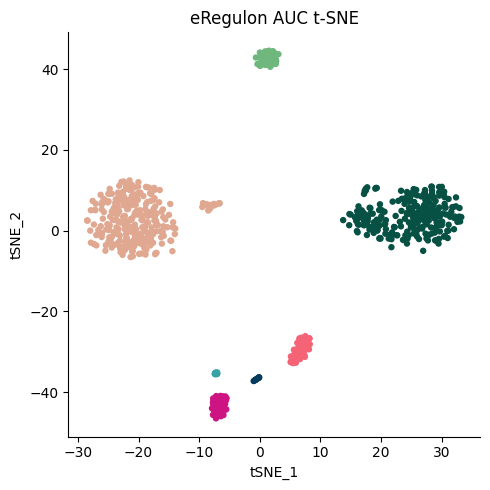

In [11]:
# Visualize UMAP, tSNE
from scenicplus.dimensionality_reduction import plot_metadata_given_ax
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#specify color_dictionary

color_dict = {
    'D1_Alpha': "#065143",
    'D1_Beta': "#70B77E",
    'D2_MSNs': "#E0A890",
    'Astrocytes': "#F56476",
    'Oligodendrocytes': "#CE1483",
    'OPC': "#053C5E" ,
    'Microglia': "#38A3A5",
}

# fig, axs = plt.subplots(ncols=2, figsize = (16, 8))


# plot_metadata_given_ax(
#     scplus_obj=scplus_obj,
#     ax = axs[0],
#     reduction_name = 'eRegulons_UMAP',
#     variable = 'Identities', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
#     color_dictionary={'Identities': color_dict},
#     dot_size = 13,
#     text_size = 17
# )

fig, axs = plt.subplots(ncols=1, figsize = (5, 5))
# https://stackoverflow.com/questions/52273546/matplotlib-typeerror-axessubplot-object-is-not-subscriptable

plot_metadata_given_ax(
    scplus_obj=scplus_obj,
    ax = axs,
    reduction_name = 'eRegulons_tSNE',
    variable = 'Identities', #note the GEX_ prefix, this metadata originated from the gene expression metadata (on which we did the cell type annotation before)
    color_dictionary={'Identities': color_dict},
    dot_size = 13,
    text_size = 15,
    show_label = False
)
fig.tight_layout()
sns.despine(ax = axs) #remove top and right edge of axis border
# sns.despine(ax = axs[1]) #remove top and right edge of axis border
plt.grid(visible=False)
plt.title('eRegulon AUC t-SNE')
# plt.savefig('/n/scratch3/users/x/xl266/nucleus_accumbens_final_plots/fig2/eregulon_auc_tsne.pdf', format='pdf')
# plt.savefig('/n/scratch3/users/x/xl266/nucleus_accumbens_final_plots/fig2/eregulon_auc_tsne_nolabels.pdf', format='pdf')


plt.show()



In [9]:
# "generate pseudobulk gene expression and region accessibility data, per celltype, 
# to limit the amount of noise for the correlation calculation."

from scenicplus.cistromes import TF_cistrome_correlation, generate_pseudobulks

generate_pseudobulks(
        scplus_obj = scplus_obj,
        variable = 'Identities',
        auc_key = 'eRegulon_AUC_filtered',
        signature_key = 'Gene_based')
generate_pseudobulks(
        scplus_obj = scplus_obj,
        variable = 'Identities',
        auc_key = 'eRegulon_AUC_filtered',
        signature_key = 'Region_based')

TF_cistrome_correlation(
            scplus_obj,
            use_pseudobulk = True,
            variable = 'Identities',
            auc_key = 'eRegulon_AUC_filtered',
            signature_key = 'Gene_based',
            out_key = 'filtered_gene_based')
TF_cistrome_correlation(
            scplus_obj,
            use_pseudobulk = True,
            variable = 'Identities',
            auc_key = 'eRegulon_AUC_filtered',
            signature_key = 'Region_based',
            out_key = 'filtered_region_based')

/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [10]:
scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based'].head()


,TF,Cistrome,Rho,P-value,Adjusted_p-value
0,Gabpb1,Gabpb1_-_(15r),-0.761817,9.546809e-134,4.268787e-133
1,Gmeb1,Gmeb1_extended_+_(233r),0.637767,3.429524e-81,9.499479e-81
2,Sox4,Sox4_+_(334r),-0.215477,8.482047e-09,1.017196e-08
3,Hoxb1,Hoxb1_extended_+_(19r),0.313527,1.971711e-17,2.767469e-17
4,Olig1,Olig1_extended_-_(29r),0.697141,5.760222e-103,2.025786e-102


In [14]:
import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 20), facecolor='white')



/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


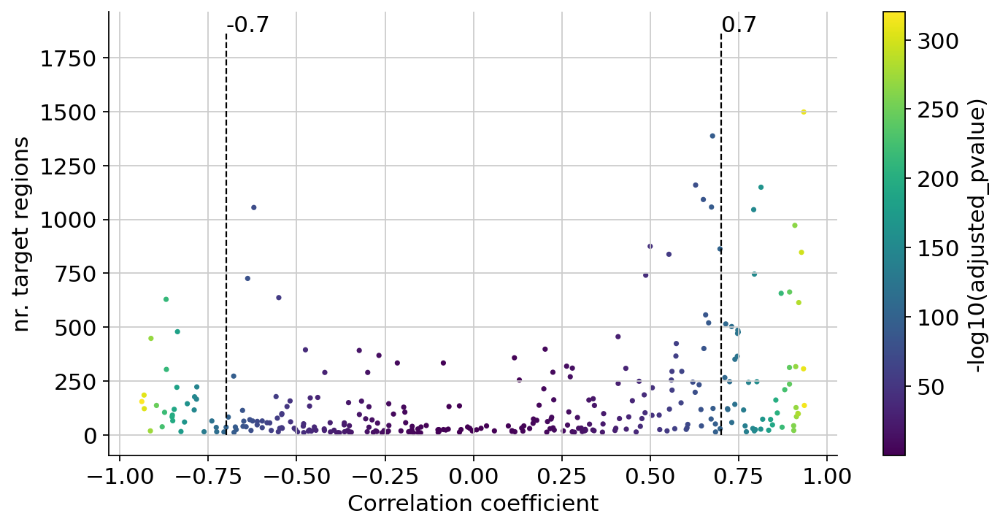

In [15]:
import numpy as np
n_targets = [int(x.split('(')[1].replace('r)', '')) for x in scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Cistrome']]
rho = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'].to_list()
adj_pval = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Adjusted_p-value'].to_list()

thresholds = {
        'rho': [-0.7, 0.7],
        'n_targets': 0
}
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (10, 5))
sc = ax.scatter(rho, n_targets, c = -np.log10(adj_pval), s = 5)
ax.set_xlabel('Correlation coefficient')
ax.set_ylabel('nr. target regions')
#ax.hlines(y = thresholds['n_targets'], xmin = min(rho), xmax = max(rho), color = 'black', ls = 'dashed', lw = 1)
ax.vlines(x = thresholds['rho'], ymin = 0, ymax = max(n_targets), color = 'black', ls = 'dashed', lw = 1)
ax.text(x = thresholds['rho'][0], y = max(n_targets), s = str(thresholds['rho'][0]))
ax.text(x = thresholds['rho'][1], y = max(n_targets), s = str(thresholds['rho'][1]))
sns.despine(ax = ax)
fig.colorbar(sc, label = '-log10(adjusted_pvalue)', ax = ax)
plt.show()

In [16]:
selected_cistromes = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based'].loc[
        np.logical_or(
                scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'] > thresholds['rho'][1],
                scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'] < thresholds['rho'][0]
        )]['Cistrome'].to_list()
selected_eRegulons = [x.split('_(')[0] for x in selected_cistromes]
selected_eRegulons_gene_sig = [
        x for x in scplus_obj.uns['eRegulon_signatures_filtered']['Gene_based'].keys()
        if x.split('_(')[0] in selected_eRegulons]
selected_eRegulons_region_sig = [
        x for x in scplus_obj.uns['eRegulon_signatures_filtered']['Region_based'].keys()
        if x.split('_(')[0] in selected_eRegulons]
#save the results in the scenicplus object
scplus_obj.uns['selected_eRegulon'] = {'Gene_based': selected_eRegulons_gene_sig, 'Region_based': selected_eRegulons_region_sig}
print(f'selected: {len(selected_eRegulons_gene_sig)} eRegulons')

selected: 87 eRegulons


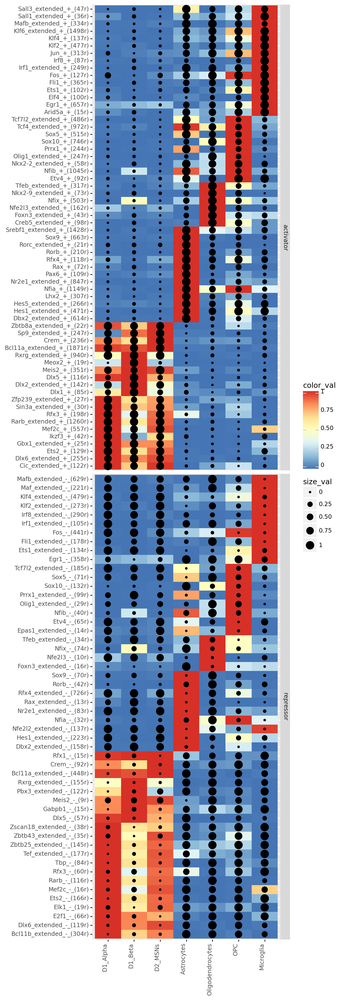

<ggplot: (8745606390029)>

In [17]:
import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 20), facecolor='white')


from scenicplus.plotting.dotplot import heatmap_dotplot
heatmap_dotplot(
        scplus_obj = scplus_obj,
        size_matrix = scplus_obj.uns['eRegulon_AUC_filtered']['Region_based'], #specify what to plot as dot sizes, target region enrichment in this case
        color_matrix = scplus_obj.to_df('EXP'), #specify  what to plot as colors, TF expression in this case
        scale_size_matrix = True,
        scale_color_matrix = True,
        group_variable = 'Identities',
        subset_eRegulons = scplus_obj.uns['selected_eRegulon']['Gene_based'],
        index_order = ['D1_Alpha', 'D1_Beta', 'D2_MSNs', 'Astrocytes', 'Oligodendrocytes', 'OPC', 'Microglia'],
        figsize = (5, 25),
        orientation = 'vertical')
#         save = '/home/xl266/nucleus_accumbens_final_plots/fig_s2/heatmap_dotplot_0.7_TF_exp_regionAUC.pdf')

# UMAP visualization of eRegulon AUC

In [19]:
import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 20), facecolor='white')


/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:126: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:160: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:196: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


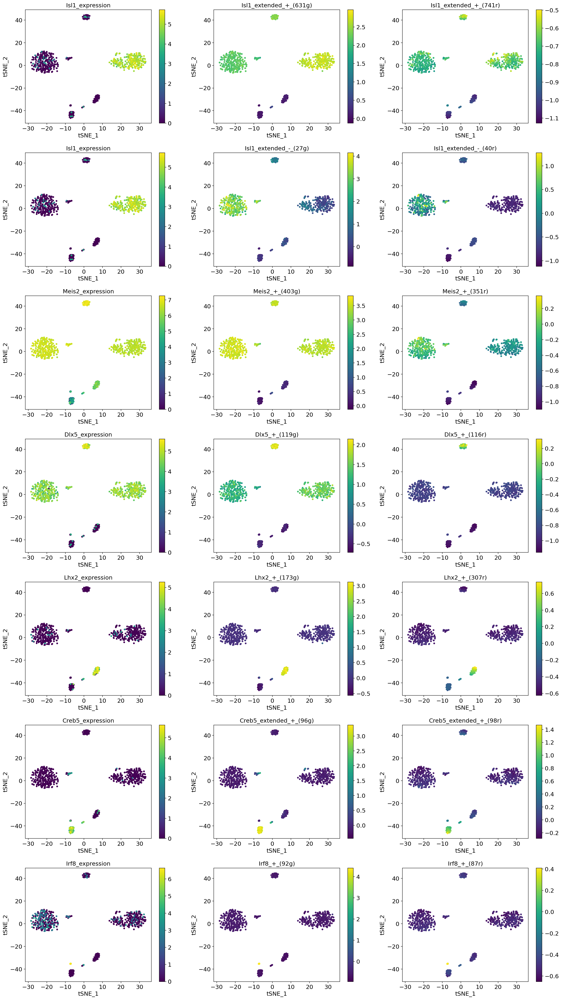

In [22]:
from scenicplus.dimensionality_reduction import plot_eRegulon

# Using no-gridlines modified function (defind end of notebook)
plot_eRegulon_nogrid(
    scplus_obj = scplus_obj,
    reduction_name = 'eRegulons_tSNE',
    selected_regulons = ['Isl1_extended_+',
                         'Isl1_extended_-',
                        'Meis2_+',
                        'Dlx5_+',
                        'Lhx2_+',
                        'Creb5_extended_+',
                        'Irf8_+'],
    scale = True,
    auc_key = 'eRegulon_AUC_filtered'
#     save=os.path.join(save_dir, 'fig3/eRegulons_enrichment_umap_nogrid.pdf')
)



/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:126: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:160: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/xl266/jupytervenv_scenicplus/lib/python3.7/site-packages/ipykernel_launcher.py:196: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


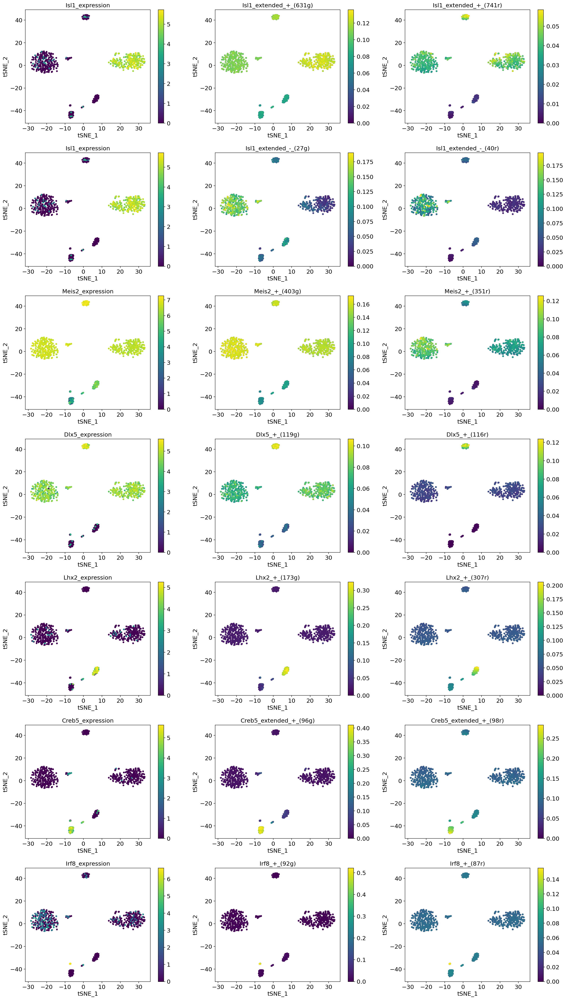

In [23]:
# No scaling by scikit learn
from scenicplus.dimensionality_reduction import plot_eRegulon

# Using no-gridlines modified function (defind end of notebook)
plot_eRegulon_nogrid(
    scplus_obj = scplus_obj,
    reduction_name = 'eRegulons_tSNE',
    selected_regulons = ['Isl1_extended_+',
                         'Isl1_extended_-',
                        'Meis2_+',
                        'Dlx5_+',
                        'Lhx2_+',
                        'Creb5_extended_+',
                        'Irf8_+'],
    scale = False,
    auc_key = 'eRegulon_AUC_filtered')
#     save=os.path.join(save_dir, 'fig3/eRegulons_enrichment_umap_nogrid_noscale.pdf')





# Check Signac and SCENIC+

In [15]:
import pandas as pd
signac_motifs = "/n/scratch3/users/p/pab1164/NAc/Supp_Table2_Motifs_Filtered_by_FDR.csv"

In [18]:
signac_motifs_df = pd.read_csv(signac_motifs, index_col=0)

## Microglia

In [61]:
signac_motifs_df[signac_motifs_df['cluster'] == 'D1_Alpha']

,X,motif,observed,background,percent.observed,percent.background,fold.enrichment,pvalue,motif.name,p.adjust,cluster,peaks
207,MA1608.11,MA1608.1,34,1771,14.655172,3.542,4.137542,2.769598e-12,Isl1,1.595288e-09,D1_Alpha,232
208,MA1622.11,MA1622.1,80,8514,34.482759,17.028,2.025062,9.438645e-11,Smad2::Smad3,2.718330e-08,D1_Alpha,232
209,MA0099.11,MA0099.1,60,5606,25.862069,11.212,2.306642,4.032387e-10,JUN::FOS,7.742184e-08,D1_Alpha,232
210,MA0075.11,MA0075.1,171,27880,73.706897,55.760,1.321860,1.137846e-08,Prrx2,1.638498e-06,D1_Alpha,232
211,MA0151.11,MA0151.1,111,15543,47.844828,31.086,1.539112,6.720361e-08,Arid3a,7.741856e-06,D1_Alpha,232
...,...,...,...,...,...,...,...,...,...,...,...,...
466,PH0108.11,PH0108.1,25,3505,10.775862,7.010,1.537213,2.170157e-02,Msx3,4.807733e-02,D1_Alpha,232
467,PB0139.11,PB0139.1,8,733,3.448276,1.466,2.352166,2.191121e-02,Irf5_2,4.835577e-02,D1_Alpha,232
468,PB0016.11,PB0016.1,26,3691,11.206897,7.382,1.518138,2.227678e-02,Foxj1_1,4.897491e-02,D1_Alpha,232
469,PH0025.11,PH0025.1,13,1489,5.603448,2.978,1.881615,2.253550e-02,Dmbx1,4.916836e-02,D1_Alpha,232


In [65]:
eregulons_metadata = scplus_obj.uns['eRegulon_metadata_filtered']

In [60]:
eregulons_metadata.shape

(65252, 16)

In [67]:
# Save 'filtered' eRegulons as csv file
# eregulons_metadata.to_csv('/n/scratch3/users/x/xl266/nucleus_accumbens_final_plots/fig2/eregulons_metadata_filtered.csv')

In [27]:
eregulons_metadata[eregulons_metadata['Region_signature_name'].str.contains('Ets1_+')].sort_values(by=['TF2G_importance'], ascending=False)

,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
20,Ets1_+_(102r),Ets1_+_(73g),Ets1,False,chr9:32695598-32696232,Ets1,0.158784,0.148430,0.023568,0.023568,11.002591,1,1.000000,11.002591,11.002591,Ets1_+_+
19,Ets1_+_(102r),Ets1_+_(73g),Ets1,False,chr9:32540221-32540440,Ets1,0.187719,0.162558,0.030515,0.030515,11.002591,1,1.000000,11.002591,11.002591,Ets1_+_+
72,Ets1_+_(102r),Ets1_+_(73g),Ets1,False,chr2:129296971-129297907,Il1b,0.094282,0.060524,0.005706,0.005706,11.002581,1,0.640722,7.049598,7.049598,Ets1_+_+
73,Ets1_+_(102r),Ets1_+_(73g),Ets1,False,chr2:129360015-129360834,Il1b,0.210388,0.147987,0.031135,0.031135,11.002581,1,0.640722,7.049598,7.049598,Ets1_+_+
25,Ets1_+_(102r),Ets1_+_(73g),Ets1,False,chr4:145239453-145239703,Tnfrsf1b,0.077250,0.128973,0.009963,0.009963,5.712479,1,0.617990,3.530256,3.530256,Ets1_+_+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,Ets1_extended_-_(134r),Ets1_extended_-_(78g),Ets1,True,chr11:55501914-55502486,Atox1,0.088090,0.417092,0.036742,0.036742,0.043038,-1,-0.067537,-0.002907,0.002907,Ets1_-_+
46,Ets1_extended_-_(134r),Ets1_extended_-_(78g),Ets1,True,chr15:85001067-85001701,Fam118a,0.031579,0.154126,0.004867,0.004867,0.042886,-1,-0.053294,-0.002286,0.002286,Ets1_-_+
47,Ets1_extended_-_(134r),Ets1_extended_-_(78g),Ets1,True,chr15:84902023-84902599,Fam118a,0.069715,0.278096,0.019387,0.019387,0.042886,-1,-0.053294,-0.002286,0.002286,Ets1_-_+
133,Ets1_extended_-_(134r),Ets1_extended_-_(78g),Ets1,True,chr13:76055717-76056772,Rfesd,0.091349,0.493715,0.045100,0.045100,0.042809,-1,-0.117939,-0.005049,0.005049,Ets1_-_+


In [ ]:
# Plot TF expression vs gene/region based eRegulon AUC for pseudobulk cells
# Scroll down

# Marker genes in nucleus accumbens

In [63]:
import pandas as pd
markers = pd.read_csv("/n/scratch3/users/p/pab1164/NAc/NAc.scRNA.AllMarkers.csv")
set(markers['cluster'])


{'Astrocytes',
 'D1_Main',
 'D1_Other',
 'D2_MSNs',
 'Microglia',
 'OPC',
 'Oligodendrocytes'}

In [68]:
celltype = 'Oligodendrocytes'
markers[markers['cluster'] == celltype][:10]

,Unnamed: 0,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
8029,Ptgds,0.0,6.615172,0.912,0.157,0.0,Oligodendrocytes,Ptgds
8030,Plp1,0.0,6.591502,1.000,0.281,0.0,Oligodendrocytes,Plp1
8031,Cldn11,0.0,5.662552,1.000,0.060,0.0,Oligodendrocytes,Cldn11
8032,Mal,0.0,5.494194,0.999,0.032,0.0,Oligodendrocytes,Mal
8033,Mobp,0.0,5.379883,1.000,0.091,0.0,Oligodendrocytes,Mobp
8034,Mbp,0.0,5.151702,1.000,0.335,0.0,Oligodendrocytes,Mbp
8035,Apod,0.0,5.140625,0.992,0.066,0.0,Oligodendrocytes,Apod
8036,Sept4,0.0,5.140369,1.000,0.253,0.0,Oligodendrocytes,Sept4
8037,Cnp,0.0,5.139362,1.000,0.325,0.0,Oligodendrocytes,Cnp
8038,Trf,0.0,5.057925,1.000,0.149,0.0,Oligodendrocytes,Trf


# Check peak-eRegulon overlap

In [135]:
import pandas as pd
import pyranges as pr
peak_gene_links = "/n/scratch3/users/p/pab1164/NAc/Supp_Table3_peak_gene_corr.csv"
peak_gene_links_df = pd.read_csv(peak_gene_links, index_col = 0)
peak_gene_links_df

,gene,peak,cor,chromosome.x,gene.start,gene.end,gene.strand,gene.center,chromosome.y,peak.start,peak.end,peak.center,distance,TSS.position,gene_biotype,distancetoTSS
1,0610007P14Rik,chr12-84642771-84643475,0.525,chr12,85815448,85824550,-,85819999.0,chr12,84642771,84643475,84643123.0,1176876.0,85824550,protein_coding,-1181427.0
2,0610007P14Rik,chr12-89025603-89026051,0.623,chr12,85815448,85824550,-,85819999.0,chr12,89025603,89026051,89025827.0,-3205828.0,85824550,protein_coding,3201277.0
3,0610007P14Rik,chr12-12311652-12312391,0.576,chr12,85815448,85824550,-,85819999.0,chr12,12311652,12312391,12312021.5,73507977.5,85824550,protein_coding,-73512528.5
4,0610007P14Rik,chr12-26596260-26596977,0.672,chr12,85815448,85824550,-,85819999.0,chr12,26596260,26596977,26596618.5,59223380.5,85824550,protein_coding,-59227931.5
5,0610007P14Rik,chr12-3576594-3576955,0.692,chr12,85815448,85824550,-,85819999.0,chr12,3576594,3576955,3576774.5,82243224.5,85824550,protein_coding,-82247775.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320526,Zyg11b,chr4-140354897-140355305,0.574,chr4,108229724,108301096,-,108265410.0,chr4,140354897,140355305,140355101.0,-32089691.0,108301096,protein_coding,32054005.0
320527,Zyg11b,chr4-131078086-131078539,0.540,chr4,108229724,108301096,-,108265410.0,chr4,131078086,131078539,131078312.5,-22812902.5,108301096,protein_coding,22777216.5
320528,Zyg11b,chr4-120037292-120037689,0.667,chr4,108229724,108301096,-,108265410.0,chr4,120037292,120037689,120037490.5,-11772080.5,108301096,protein_coding,11736394.5
320529,Zyg11b,chr4-33823397-33823638,0.542,chr4,108229724,108301096,-,108265410.0,chr4,33823397,33823638,33823517.5,74441892.5,108301096,protein_coding,-74477578.5


In [136]:
# Convert to 0-based, half closed
peak_gene_links_df['peak.start'] = peak_gene_links_df['peak.start'] - 1

In [137]:
# only positive R2G relationships are kept after filtering
eRegulon_metadata_filt = scplus_obj.uns['eRegulon_metadata_filtered'].copy()

In [138]:
# Prepare eRegulon input for pybedtools intersect

# Create Chromosome, Start, End columns
eRegulon_metadata_filt['chrom'] = eRegulon_metadata_filt['Region'].apply(lambda x: x.split(':')[0])
eRegulon_metadata_filt['start'] = eRegulon_metadata_filt['Region'].apply(lambda x: x.split(':')[1].split('-')[0])
eRegulon_metadata_filt['end'] = eRegulon_metadata_filt['Region'].apply(lambda x: x.split(':')[1].split('-')[1])


# https://www.geeksforgeeks.org/how-to-move-a-column-to-first-position-in-pandas-dataframe/
chrom_regulon = eRegulon_metadata_filt.pop('chrom')
start_regulon = eRegulon_metadata_filt.pop('start')
end_regulon = eRegulon_metadata_filt.pop('end')

eRegulon_metadata_filt.insert(0, 'end', end_regulon)
eRegulon_metadata_filt.insert(0, 'start', start_regulon)
eRegulon_metadata_filt.insert(0, 'chrom', chrom_regulon)


eRegulon_metadata_filt = eRegulon_metadata_filt.astype('str')
eRegulon_metadata_filt = eRegulon_metadata_filt.astype({'start': 'int32'})
eRegulon_metadata_filt = eRegulon_metadata_filt.astype({'end': 'int32'})

regulon_rows_l = eRegulon_metadata_filt.values.tolist()
regulon_rows_l

[['chr2',
  127008364,
  127009091,
  'Arid5a_+_(15r)',
  'Arid5a_+_(14g)',
  'Arid5a',
  'False',
  'chr2:127008364-127009091',
  'Itpripl1',
  '0.037241971637211914',
  '0.14110421324791717',
  '0.005254999107670032',
  '0.005254999107670032',
  '3.7122625880997857',
  '1',
  '0.3648431585589882',
  '1.35439360804269',
  '1.35439360804269',
  'Arid5a_+_+'],
 ['chr17',
  34119116,
  34119890,
  'Arid5a_+_(15r)',
  'Arid5a_+_(14g)',
  'Arid5a',
  'False',
  'chr17:34119116-34119890',
  'H2-Ob',
  '0.042731951070069156',
  '0.13201592153381012',
  '0.005641297899452863',
  '0.005641297899452863',
  '3.6393547315938224',
  '1',
  '0.44091430648718755',
  '1.6046435675415547',
  '1.6046435675415547',
  'Arid5a_+_+'],
 ['chr14',
  70442915,
  70443749,
  'Arid5a_+_(15r)',
  'Arid5a_+_(14g)',
  'Arid5a',
  'False',
  'chr14:70442915-70443749',
  'Reep4',
  '0.04366656765067684',
  '0.13464078234949245',
  '0.005879300831004169',
  '0.005879300831004169',
  '2.785811560016561',
  '1',
  '0.2

In [139]:
# Prepare peak gene links input for pybedtools intersect

# Create Chromosome, Start, End columns
# https://www.geeksforgeeks.org/how-to-move-a-column-to-first-position-in-pandas-dataframe/
chrom_regulon = peak_gene_links_df.pop('chromosome.y')
start_regulon = peak_gene_links_df.pop('peak.start')
end_regulon = peak_gene_links_df.pop('peak.end')

peak_gene_links_df.insert(0, 'end', end_regulon)
peak_gene_links_df.insert(0, 'start', start_regulon)
peak_gene_links_df.insert(0, 'chrom', chrom_regulon)


peak_gene_links_df = peak_gene_links_df.astype('str')
peak_gene_links_df = peak_gene_links_df.astype({'start': 'int32'})
peak_gene_links_df = peak_gene_links_df.astype({'end': 'int32'})

peak_gene_links_l = peak_gene_links_df.values.tolist()
peak_gene_links_l

[['chr12',
  84642770,
  84643475,
  '0610007P14Rik',
  'chr12-84642771-84643475',
  '0.525',
  'chr12',
  '85815448',
  '85824550',
  '-',
  '85819999.0',
  '84643123.0',
  '1176876.0',
  '85824550',
  'protein_coding',
  '-1181427.0'],
 ['chr12',
  89025602,
  89026051,
  '0610007P14Rik',
  'chr12-89025603-89026051',
  '0.623',
  'chr12',
  '85815448',
  '85824550',
  '-',
  '85819999.0',
  '89025827.0',
  '-3205828.0',
  '85824550',
  'protein_coding',
  '3201277.0'],
 ['chr12',
  12311651,
  12312391,
  '0610007P14Rik',
  'chr12-12311652-12312391',
  '0.576',
  'chr12',
  '85815448',
  '85824550',
  '-',
  '85819999.0',
  '12312021.5',
  '73507977.5',
  '85824550',
  'protein_coding',
  '-73512528.5'],
 ['chr12',
  26596259,
  26596977,
  '0610007P14Rik',
  'chr12-26596260-26596977',
  '0.672',
  'chr12',
  '85815448',
  '85824550',
  '-',
  '85819999.0',
  '26596618.5',
  '59223380.5',
  '85824550',
  'protein_coding',
  '-59227931.5'],
 ['chr12',
  3576593,
  3576955,
  '0610007P

In [140]:
import pybedtools
bedtools_path = '/n/scratch3/users/x/xl266/atac/bedtools2/bin'
pybedtools.helpers.set_bedtools_path(path=bedtools_path)

filtered_regulon_rows_pybedtool = pybedtools.BedTool(regulon_rows_l)
peak_gene_pybedtool = pybedtools.BedTool(peak_gene_links_l)

intersect = peak_gene_pybedtool.intersect(filtered_regulon_rows_pybedtool, wao=True)
intersect_df = intersect.to_dataframe(disable_auto_names=True, header=None)
intersect_df

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,chr12,84642770,84643475,0610007P14Rik,chr12-84642771-84643475,0.525,chr12,85815448,85824550,-,...,0.4709246300608164,0.03670644057447401,0.03670644057447401,4.941746432528315,1,0.5788566528415482,2.860562799125002,2.860562799125002,Ube2k_+_+,705
1,chr12,89025602,89026051,0610007P14Rik,chr12-89025603-89026051,0.623,chr12,85815448,85824550,-,...,0.1611943376948671,0.0016631054578883132,0.0016631054578883132,6.967307673566266,1,0.5278855687974057,3.6779411742470574,3.6779411742470574,Isl1_+_+,449
2,chr12,89025602,89026051,0610007P14Rik,chr12-89025603-89026051,0.623,chr12,85815448,85824550,-,...,0.1611943376948671,0.0016631054578883132,0.0016631054578883132,0.89268634311109,1,0.7421061737090244,0.6624680464084723,0.6624680464084723,Pura_+_+,449
3,chr12,12311651,12312391,0610007P14Rik,chr12-12311652-12312391,0.576,chr12,85815448,85824550,-,...,.,.,.,.,.,.,.,.,.,0
4,chr12,26596259,26596977,0610007P14Rik,chr12-26596260-26596977,0.672,chr12,85815448,85824550,-,...,.,.,.,.,.,.,.,.,.,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
922895,chr4,140354896,140355305,Zyg11b,chr4-140354897-140355305,0.574,chr4,108229724,108301096,-,...,.,.,.,.,.,.,.,.,.,0
922896,chr4,131078085,131078539,Zyg11b,chr4-131078086-131078539,0.540,chr4,108229724,108301096,-,...,.,.,.,.,.,.,.,.,.,0
922897,chr4,120037291,120037689,Zyg11b,chr4-120037292-120037689,0.667,chr4,108229724,108301096,-,...,.,.,.,.,.,.,.,.,.,0
922898,chr4,33823396,33823638,Zyg11b,chr4-33823397-33823638,0.542,chr4,108229724,108301096,-,...,.,.,.,.,.,.,.,.,.,0


In [141]:
intersect_df.columns = pd.concat([pd.Series(peak_gene_links_df.columns), pd.Series(eRegulon_metadata_filt.columns), pd.Series(['bp_overlap'])], ignore_index=True)

In [142]:
# Only get overlaps
intersect_df_filt = intersect_df[intersect_df['bp_overlap'] != 0]
intersect_df_filt.shape

(729911, 36)

In [143]:
intersect_df_filt_dedup = intersect_df_filt.drop_duplicates()
intersect_df_filt_dedup

,chrom,start,end,gene,peak,cor,chromosome.x,gene.start,gene.end,gene.strand,...,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name,bp_overlap
0,chr12,84642770,84643475,0610007P14Rik,chr12-84642771-84643475,0.525,chr12,85815448,85824550,-,...,0.4709246300608164,0.03670644057447401,0.03670644057447401,4.941746432528315,1,0.5788566528415482,2.860562799125002,2.860562799125002,Ube2k_+_+,705
1,chr12,89025602,89026051,0610007P14Rik,chr12-89025603-89026051,0.623,chr12,85815448,85824550,-,...,0.1611943376948671,0.0016631054578883132,0.0016631054578883132,6.967307673566266,1,0.5278855687974057,3.6779411742470574,3.6779411742470574,Isl1_+_+,449
2,chr12,89025602,89026051,0610007P14Rik,chr12-89025603-89026051,0.623,chr12,85815448,85824550,-,...,0.1611943376948671,0.0016631054578883132,0.0016631054578883132,0.89268634311109,1,0.7421061737090244,0.6624680464084723,0.6624680464084723,Pura_+_+,449
6,chr12,107827935,107828950,0610007P14Rik,chr12-107827936-107828950,0.661,chr12,85815448,85824550,-,...,0.3559682708746554,0.005372810494320214,0.005372810494320214,1.6249308240865412,1,0.714399669605599,1.1608500438593787,1.1608500438593787,Ube2k_+_+,1015
10,chr12,75321518,75322150,0610007P14Rik,chr12-75321519-75322150,0.579,chr12,85815448,85824550,-,...,0.19193404062991773,0.00880959666986336,0.00880959666986336,1.61133097526149,1,0.32267707754375047,0.5199395700530989,0.5199395700530989,Pbx1_+_+,632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
922876,chr4,131821318,131821871,Zyg11b,chr4-131821319-131821871,0.692,chr4,108229724,108301096,-,...,0.08504587154315311,0.0030278145849976196,0.0030278145849976196,0.1749307596118888,-1,-0.16465095179623568,-0.028802516068535997,0.028802516068535997,Tcf7l2_-_+,553
922878,chr4,134641566,134642573,Zyg11b,chr4-134641567-134642573,0.559,chr4,108229724,108301096,-,...,0.19916248755455876,0.004740033991178082,0.004740033991178082,0.24564658654921465,-1,-0.09941512787984277,-0.02442098681503704,0.02442098681503704,Hes1_-_+,1007
922883,chr4,54966097,54966859,Zyg11b,chr4-54966098-54966859,0.570,chr4,108229724,108301096,-,...,0.49894983243097357,0.05906784975283031,0.05906784975283031,8.29888439692136,1,0.40423012392175905,3.3546590681798745,3.3546590681798745,Isl1_+_+,762
922884,chr4,54966097,54966859,Zyg11b,chr4-54966098-54966859,0.570,chr4,108229724,108301096,-,...,0.49894983243097357,0.05906784975283031,0.05906784975283031,1.0987622594790254,1,0.2596141672358074,0.2852542489847813,0.2852542489847813,Nr2f1_+_+,762


In [144]:
intersect_df_filt_dedup[intersect_df_filt_dedup['gene'] == 'Drd1a'].sort_values(by=['TF2G_importance'], ascending=False)

,chrom,start,end,gene,peak,cor,chromosome.x,gene.start,gene.end,gene.strand,...,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name,bp_overlap
234861,chr13,54030343,54031396,Drd1a,chr13-54030344-54031396,0.990,chr13,54051186,54055658,-,...,0.8096945369342733,0.05216195462109894,0.05216195462109894,98.51440945828396,1,0.8324432528472757,82.00765546178233,82.00765546178233,Isl1_+_+,1053
234890,chr13,8112924,8113198,Drd1a,chr13-8112925-8113198,0.592,chr13,54051186,54055658,-,...,0.23067206866188703,0.00866722380273799,0.00866722380273799,9.34590543471742,1,0.31924170207155644,2.9836027583789986,2.9836027583789986,Pbx1_+_+,274
234840,chr13,116309496,116310174,Drd1a,chr13-116309497-116310174,0.584,chr13,54051186,54055658,-,...,0.7724106179515665,0.08245513698713597,0.08245513698713597,8.581956652775592,1,0.4468641125383863,3.834968443485465,3.834968443485465,Nr2f1_+_+,678
234862,chr13,54030343,54031396,Drd1a,chr13-54030344-54031396,0.990,chr13,54051186,54055658,-,...,0.7495014266869761,0.03027523917467386,0.03027523917467386,75.43576577829205,1,0.809132242031228,61.03751029353203,61.03751029353203,Isl1_+_+,1053
234833,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.395531676811957,0.03439269995582244,0.03439269995582244,7.645877300164715,1,0.47578524337197114,3.6377955920510985,3.6377955920510985,Rxrg_+_+,842
234842,chr13,116309496,116310174,Drd1a,chr13-116309497-116310174,0.584,chr13,54051186,54055658,-,...,0.7724106179515665,0.08245513698713597,0.08245513698713597,5.8064384713765556,1,0.4906052822256977,2.8486693849758438,2.8486693849758438,Thra_+_+,678
234869,chr13,54030343,54031396,Drd1a,chr13-54030344-54031396,0.990,chr13,54051186,54055658,-,...,0.7495014266869761,0.03027523917467386,0.03027523917467386,3.477524462173233,1,0.4879699620496834,1.696927479833518,1.696927479833518,Thra_+_+,1053
234832,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.395531676811957,0.03439269995582244,0.03439269995582244,3.1364299396401183,1,0.6866051596085062,2.1534889793075007,2.1534889793075007,Rarb_+_+,842
234868,chr13,54030343,54031396,Drd1a,chr13-54030344-54031396,0.990,chr13,54051186,54055658,-,...,0.8096945369342733,0.05216195462109894,0.05216195462109894,3.0200091246556844,1,0.4811843265950268,1.453181056958282,1.453181056958282,Thra_+_+,1053
234874,chr13,68913612,68914415,Drd1a,chr13-68913613-68914415,0.834,chr13,54051186,54055658,-,...,0.3746483975916028,0.021614969654049996,0.021614969654049996,2.3244262068441626,1,0.2856620963681965,0.6640004631002786,0.6640004631002786,Nr2f1_+_+,803


In [138]:
# Save csv
# intersect_df_filt_dedup.to_csv(os.path.join(work_dir, 'regulon_peakgene_overlaps.csv'))

# Figure 2

## AUC vs. TF expression plots
## Isl1, Meis2 regulons (3)

In [13]:
import os
# fig2_savedir = '/home/xl266/nucleus_accumbens_final_plots/fig2'
fig2_savedir = '/n/scratch3/users/x/xl266/nucleus_accumbens_final_plots/fig2'

In [14]:
from scenicplus.cistromes import *
# Region based
%matplotlib inline
import seaborn as sns
sns.set_style("white")
# colors = ["#E9842C","#F8766D", "#BC9D00", "#00C0B4", "#9CA700", "#6FB000", "#00B813"]
# categories = sorted(set(scplus_obj.metadata_cell['Identities']))
# color_dict = dict(zip(categories, colors[0:len(categories)]))

color_dict = {
    'D1_Alpha': "#065143",
    'D1_Beta': "#70B77E",
    'D2_MSNs': "#E0A890",
    'Astrocytes': "#F56476",
    'Oligodendrocytes': "#CE1483",
    'OPC': "#053C5E" ,
    'Microglia': "#38A3A5",
}

In [15]:
import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 5), facecolor='white')





In [16]:
import matplotlib.pyplot as plt

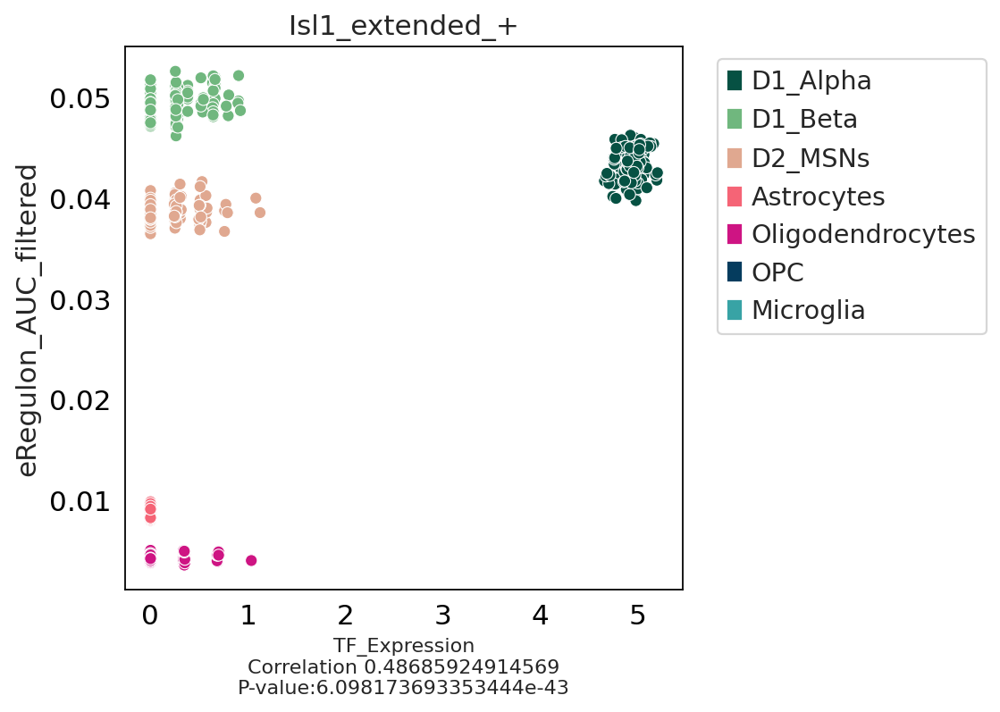

In [24]:
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Isl1_extended_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Isl1_extended_+_gene_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Isl1_extended_+_region_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Isl1_extended_+_region_based_newcolors_TEST.pdf'), format='pdf')

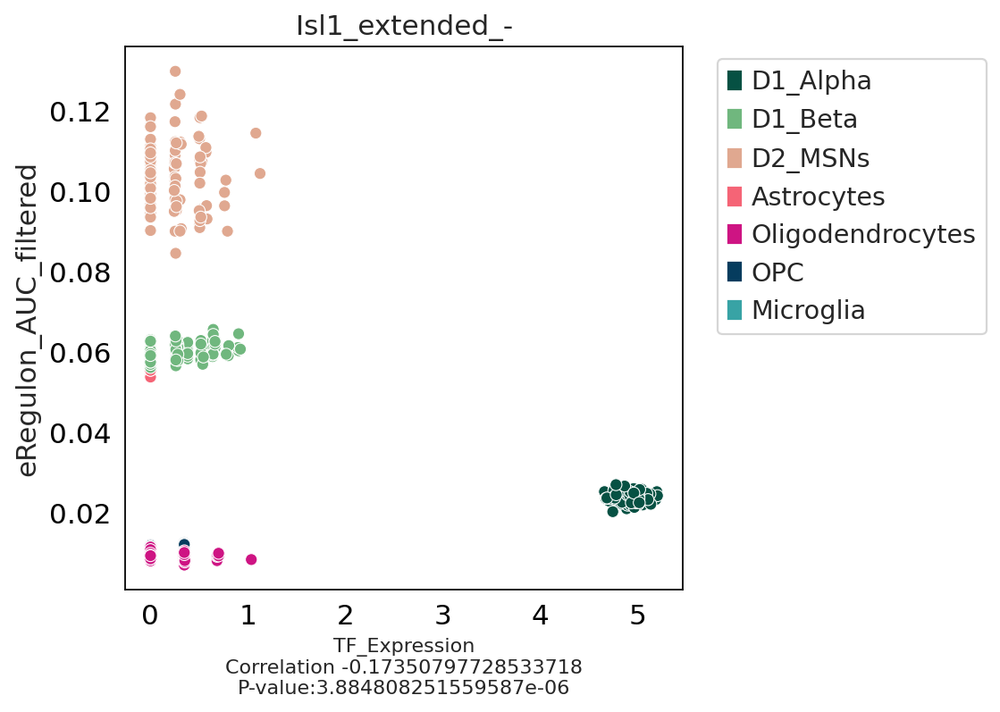

In [21]:
plt.close()
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Isl1_extended_-',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Isl1_extended_-_gene_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Isl1_extended_-_region_based_newcolors.svg'), format='svg')

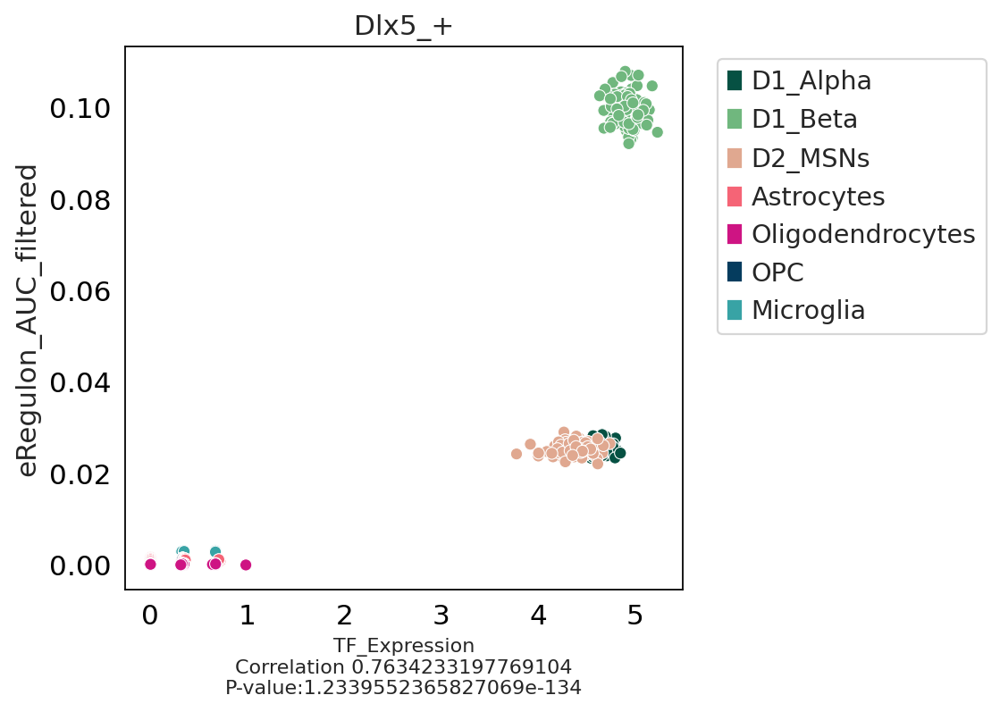

In [26]:
# D1 Beta
plt.close()
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Dlx5_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)

# plt.savefig(os.path.join(fig2_savedir, 'Dlx5_+_region_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Dlx5_+_gene_based_newcolors.svg'), format='svg')


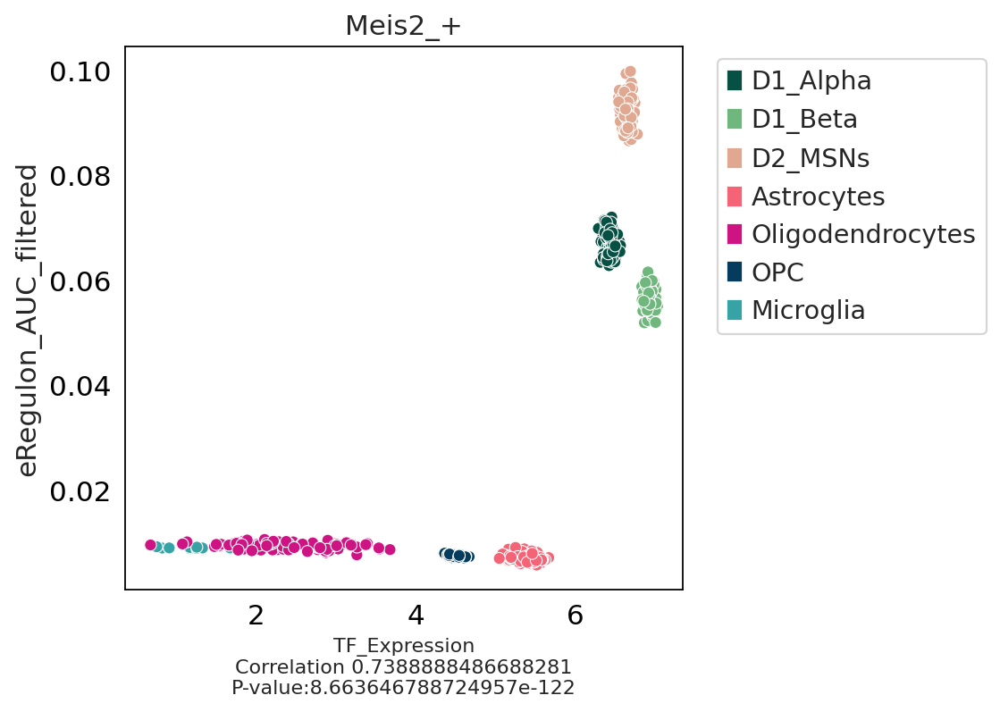

In [27]:
plt.close()
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))

prune_plot(scplus_obj,
           'Meis2_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Meis2_+_region_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Meis2_+_gene_based_newcolors.svg'), format='svg')

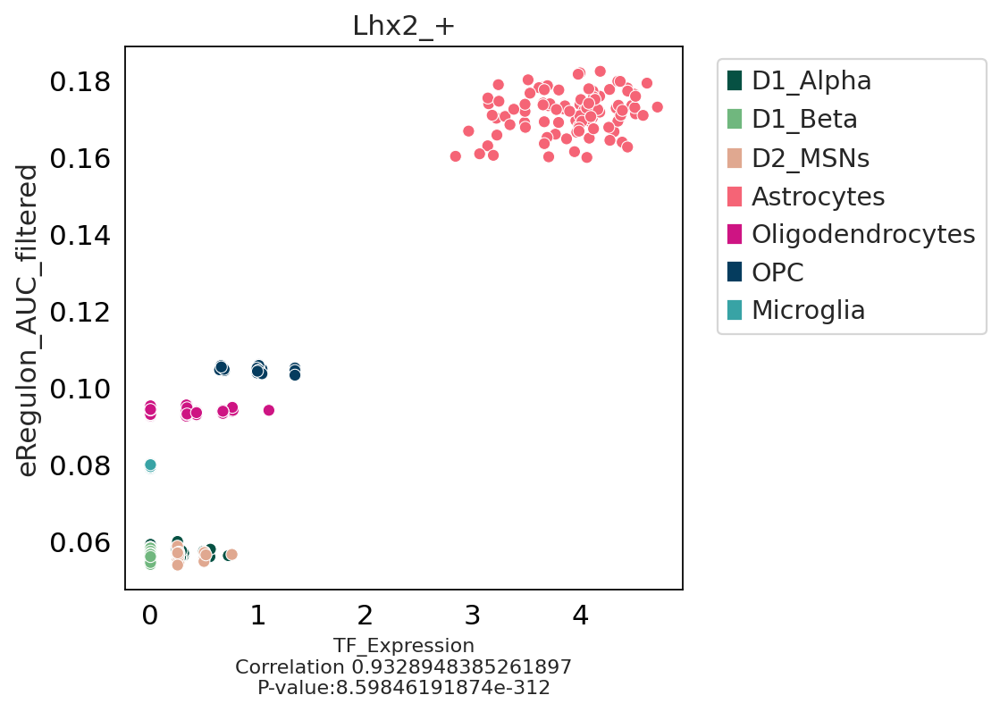

In [30]:
plt.close()
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))

prune_plot(scplus_obj,
           'Lhx2_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Lhx2_+_region_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Lhx2_+_gene_based_newcolors.svg'), format='svg')

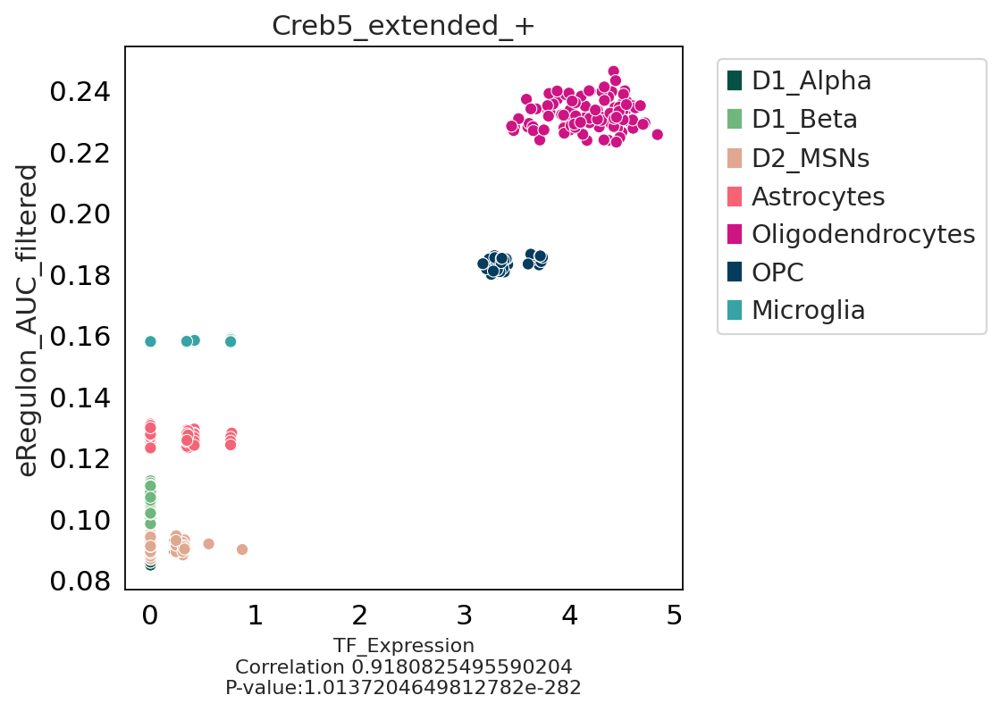

In [34]:
plt.close()
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Creb5_extended_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Creb5_extended_+_region_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Creb5_extended_+_gene_based_newcolors.svg'), format='svg')

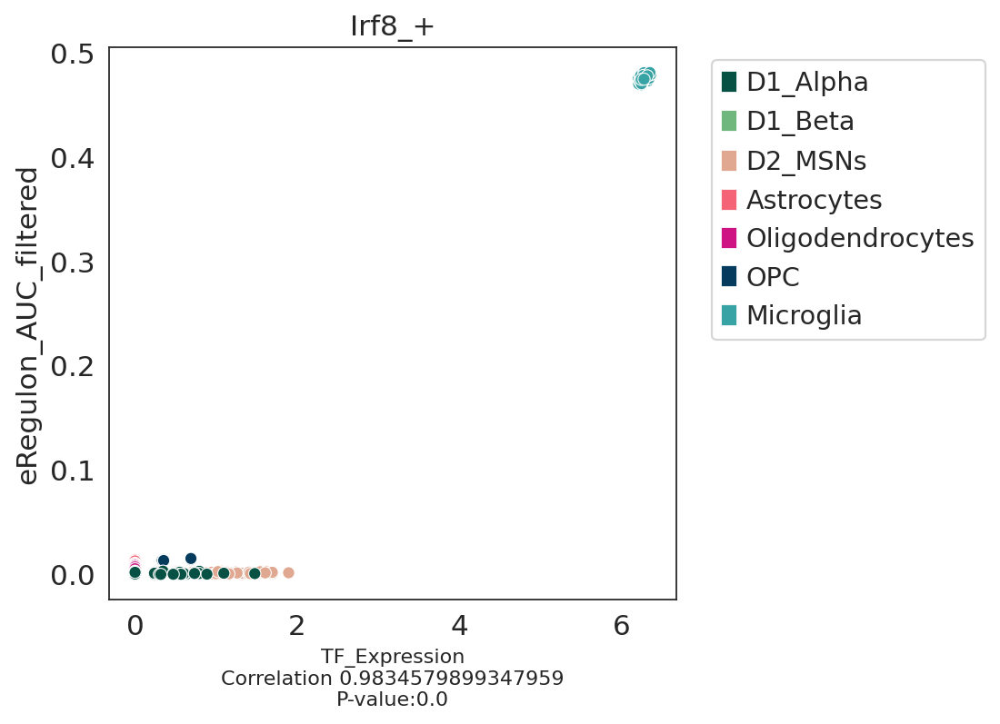

In [61]:
plt.close()
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Irf8_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Irf8_+_region_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Irf8_+_gene_based_newcolors.svg'), format='svg')

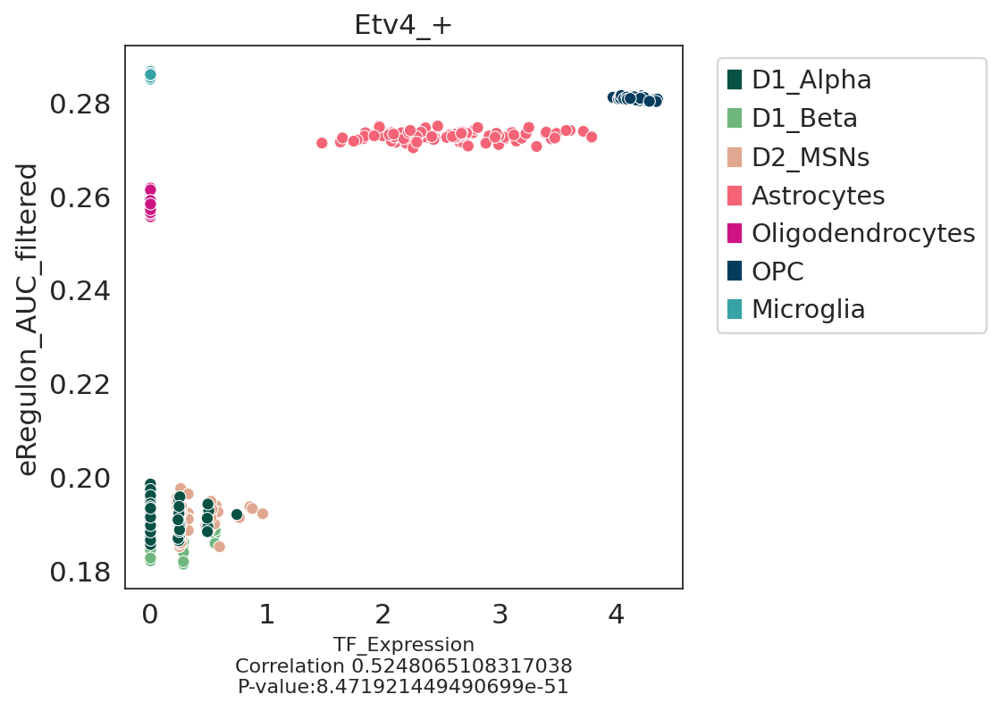

In [45]:
# OPCs
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Etv4_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Etv4_+_gene_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Etv4_+_region_based_newcolors.svg'), format='svg')

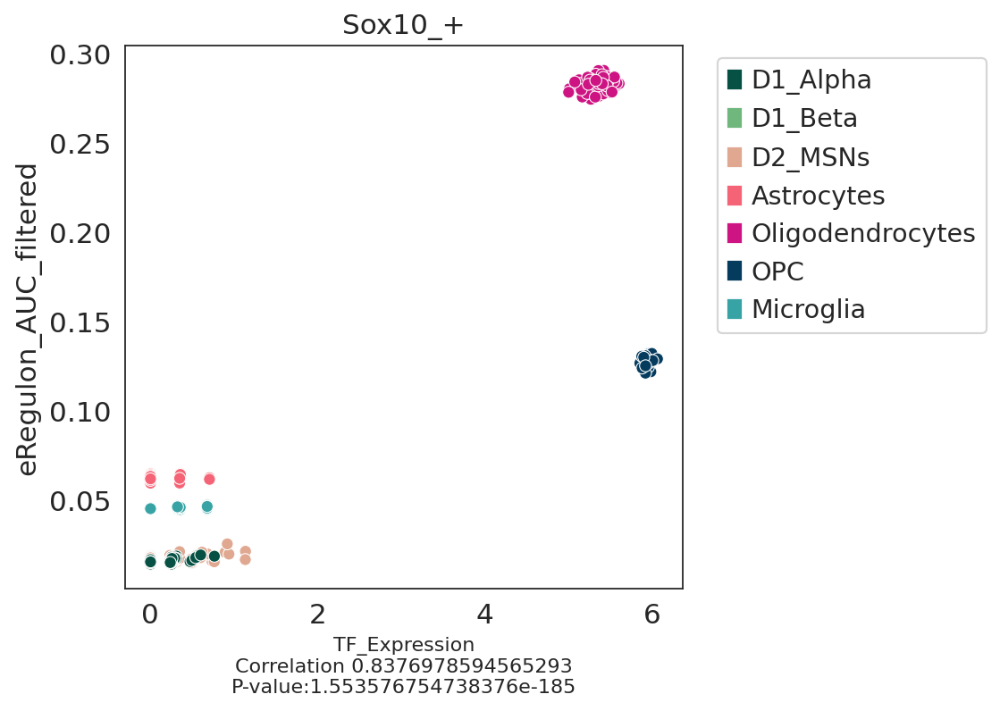

In [62]:
# OPCs
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Sox10_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Gene_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Sox10_+_gene_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Sox10_+_region_based_newcolors.svg'), format='svg')

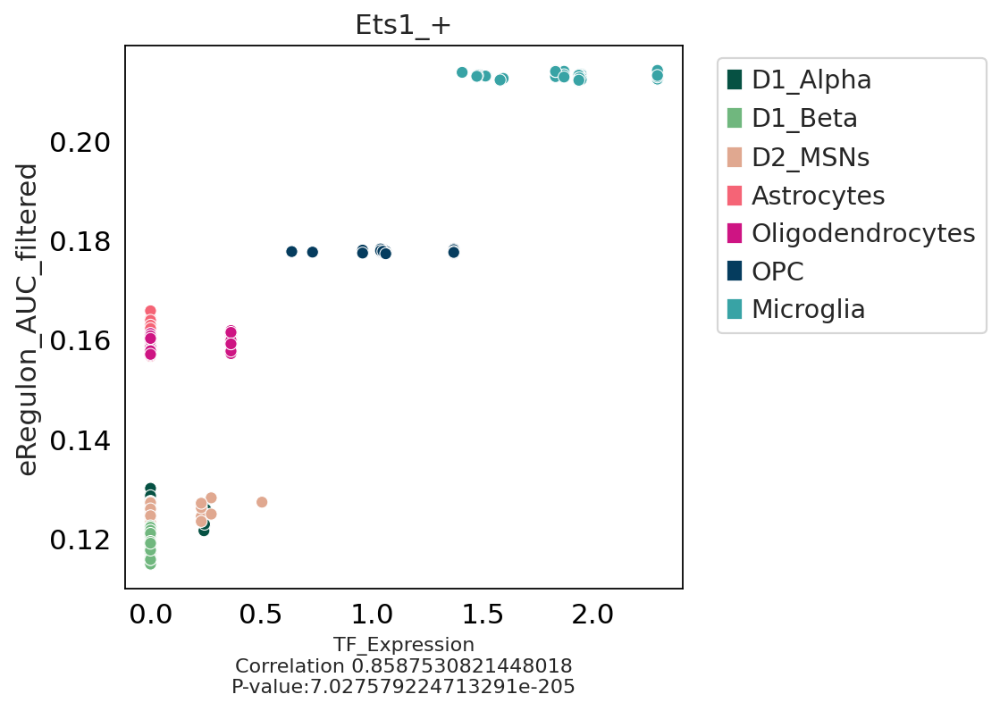

In [35]:
# Microglia
fig, axs = plt.subplots(ncols=1, figsize = (5, 5))


prune_plot(scplus_obj,
           'Ets1_+',
           pseudobulk_variable = 'Identities',
           show_dot_plot = True,
           show_line_plot = False,
           color_dict = color_dict,
           use_pseudobulk = True,
           auc_key = 'eRegulon_AUC_filtered',
           signature_key = 'Region_based',
           ax = axs,
           seed=555)
plt.grid(visible=False)
# plt.savefig(os.path.join(fig2_savedir, 'Ets1_+_gene_based_newcolors.svg'), format='svg')
# plt.savefig(os.path.join(fig2_savedir, 'Ets1_+_region_based_newcolors.svg'), format='svg')

In [7]:
eregulons_metadata = scplus_obj.uns['eRegulon_metadata_filtered']

isl1_minus = eregulons_metadata[eregulons_metadata['Region_signature_name'].str.contains('Isl1_extended_-')]
isl1_minus_drd2 = isl1_minus[isl1_minus['Gene'].str.contains('Drd2')]
isl1_minus_drd2
# isl1_minus_drd2.to_csv(os.path.join(fig2_savedir, 'Isl1_-_Drd2.csv'))


,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
3,Isl1_extended_-_(40r),Isl1_extended_-_(27g),Isl1,True,chr9:49386093-49386580,Drd2,0.041403,0.797386,0.033014,0.033014,71.660143,-1,-0.508521,-36.440695,36.440695,Isl1_-_+
4,Isl1_extended_-_(40r),Isl1_extended_-_(27g),Isl1,True,chr9:49389443-49389909,Drd2,0.069343,0.789333,0.054735,0.054735,71.660143,-1,-0.508521,-36.440695,36.440695,Isl1_-_+


In [11]:
eregulons_metadata = scplus_obj.uns['eRegulon_metadata_filtered']

isl1_plus = eregulons_metadata[eregulons_metadata['Region_signature_name'].str.contains('Isl1_extended_+')]
isl1_plus_drd1a = isl1_plus[isl1_plus['Gene'].str.contains('Drd1')]
isl1_plus_drd1a
# isl1_plus_drd1a.to_csv(os.path.join(fig2_savedir, 'Isl1_+_Drd1a.csv'))




,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
407,Isl1_extended_+_(741r),Isl1_extended_+_(631g),Isl1,True,chr13:54030343-54031396,Drd1a,0.064422,0.809695,0.052162,0.052162,98.514409,1,0.832443,82.007655,82.007655,Isl1_+_+


In [9]:
eregulons_metadata = scplus_obj.uns['eRegulon_metadata']

isl1_minus_meis2_plus = eregulons_metadata[eregulons_metadata['Region_signature_name'].str.contains('_+')]
isl1_minus_meis2_plus_drd2 = isl1_minus_meis2_plus[(isl1_minus_meis2_plus['Gene'].str.contains('Drd2')) & (isl1_minus_meis2_plus['TF'].isin(['Meis2', 'Isl1']))]
isl1_minus_meis2_plus_drd2
# isl1_minus_meis2_plus_drd2.to_csv(os.path.join(fig2_savedir, 'Isl1_-_Meis2_+_Drd2.csv'))




,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho
247,Meis2_+_+_(351r),Meis2_+_+_(403g),Meis2,False,chr9:49408345-49408833,Drd2,0.072805,0.788556,0.057411,0.057411,10.783534,1,0.454165,4.897505,4.897505
248,Meis2_+_+_(351r),Meis2_+_+_(403g),Meis2,False,chr9:49386093-49386580,Drd2,0.041403,0.797386,0.033014,0.033014,10.783534,1,0.454165,4.897505,4.897505
249,Meis2_+_+_(351r),Meis2_+_+_(403g),Meis2,False,chr9:49409367-49409797,Drd2,0.044044,0.770155,0.033921,0.033921,10.783534,1,0.454165,4.897505,4.897505
3,Isl1_extended_-_+_(40r),Isl1_extended_-_+_(27g),Isl1,True,chr9:49386093-49386580,Drd2,0.041403,0.797386,0.033014,0.033014,71.660143,-1,-0.508521,-36.440695,36.440695
4,Isl1_extended_-_+_(40r),Isl1_extended_-_+_(27g),Isl1,True,chr9:49389443-49389909,Drd2,0.069343,0.789333,0.054735,0.054735,71.660143,-1,-0.508521,-36.440695,36.440695


In [14]:
# Find reciprocal relations between D1, D2
eregulons_metadata = scplus_obj.uns['eRegulon_metadata_filtered']


plus_or_minus = eregulons_metadata[(eregulons_metadata['Region_signature_name'].str.contains('_+')) |
                  eregulons_metadata['Region_signature_name'].str.contains('_-')]

plus_or_minus[plus_or_minus['Gene'].isin(['Drd1a', 'Drd2', 'Pdyn'])]



,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
247,Meis2_+_(351r),Meis2_+_(403g),Meis2,False,chr9:49408345-49408833,Drd2,0.072805,0.788556,0.057411,0.057411,10.783534,1,0.454165,4.897505,4.897505,Meis2_+_+
248,Meis2_+_(351r),Meis2_+_(403g),Meis2,False,chr9:49386093-49386580,Drd2,0.041403,0.797386,0.033014,0.033014,10.783534,1,0.454165,4.897505,4.897505,Meis2_+_+
249,Meis2_+_(351r),Meis2_+_(403g),Meis2,False,chr9:49409367-49409797,Drd2,0.044044,0.770155,0.033921,0.033921,10.783534,1,0.454165,4.897505,4.897505,Meis2_+_+
293,Pou3f1_+_(319r),Pou3f1_+_(284g),Pou3f1,False,chr9:49386093-49386580,Drd2,0.041403,0.797386,0.033014,0.033014,0.314428,1,0.352983,0.110988,0.110988,Pou3f1_+_+
294,Pou3f1_+_(319r),Pou3f1_+_(284g),Pou3f1,False,chr9:49409367-49409797,Drd2,0.044044,0.770155,0.033921,0.033921,0.314428,1,0.352983,0.110988,0.110988,Pou3f1_+_+
12,Bach2_-_(97r),Bach2_-_(56g),Bach2,False,chr2:129564066-129564790,Pdyn,0.012390,0.344238,0.004265,0.004265,0.341321,-1,-0.199184,-0.067986,0.067986,Bach2_-_+
13,Bach2_-_(97r),Bach2_-_(56g),Bach2,False,chr2:129627543-129628285,Pdyn,0.012696,0.393140,0.004991,0.004991,0.341321,-1,-0.199184,-0.067986,0.067986,Bach2_-_+
14,Bach2_-_(97r),Bach2_-_(56g),Bach2,False,chr2:129712775-129713452,Pdyn,0.075255,0.764939,0.057566,0.057566,0.341321,-1,-0.199184,-0.067986,0.067986,Bach2_-_+
15,Bach2_-_(97r),Bach2_-_(56g),Bach2,False,chr2:129747891-129748278,Pdyn,0.133588,0.672683,0.089862,0.089862,0.341321,-1,-0.199184,-0.067986,0.067986,Bach2_-_+
16,Bach2_-_(97r),Bach2_-_(56g),Bach2,False,chr2:129733957-129734640,Pdyn,0.084480,0.687494,0.058080,0.058080,0.341321,-1,-0.199184,-0.067986,0.067986,Bach2_-_+


In [73]:
# Check Dlx5 for D1 Beta
eregulons_metadata = scplus_obj.uns['eRegulon_metadata_filtered']

eregulons_metadata[eregulons_metadata['Gene'].str.contains('Tshz1')]
# dlx5_plus = eregulons_metadata[eregulons_metadata['Region_signature_name'].str.contains('Dlx5_+')]
# dlx5_plus_tshz1 = dlx5_plus[dlx5_plus['Gene'].str.contains('Tshz1')]
# dlx5_plus_tshz1
# dlx5_plus_tshz1.to_csv(os.path.join(fig2_savedir, 'Dlx5_+_Tshz1.csv'))





,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
265,Meis2_+_(351r),Meis2_+_(403g),Meis2,False,chr18:83932618-83933381,Tshz1,0.064054,0.139721,0.008950,0.008950,6.032572,1,0.316696,1.910489,1.910489,Meis2_+_+
2467,Bcl11a_extended_+_(1871r),Bcl11a_extended_+_(1298g),Bcl11a,True,chr18:83895098-83895722,Tshz1,0.030261,0.319760,0.009676,0.009676,1.797902,1,0.199062,0.357893,0.357893,Bcl11a_+_+
568,Pbx1_extended_+_(1092r),Pbx1_extended_+_(712g),Pbx1,True,chr18:84233231-84233480,Tshz1,0.120362,0.392880,0.047288,0.047288,25.036039,1,0.532637,13.335129,13.335129,Pbx1_+_+
569,Pbx1_extended_+_(1092r),Pbx1_extended_+_(712g),Pbx1,True,chr18:83895098-83895722,Tshz1,0.030261,0.319760,0.009676,0.009676,25.036039,1,0.532637,13.335129,13.335129,Pbx1_+_+
652,Rxrg_extended_+_(940r),Rxrg_extended_+_(977g),Rxrg,True,chr18:84233231-84233480,Tshz1,0.120362,0.392880,0.047288,0.047288,15.343944,1,0.546572,8.386567,8.386567,Rxrg_+_+
653,Rxrg_extended_+_(940r),Rxrg_extended_+_(977g),Rxrg,True,chr18:83895098-83895722,Tshz1,0.030261,0.319760,0.009676,0.009676,15.343944,1,0.546572,8.386567,8.386567,Rxrg_+_+
45,Tcf7l2_extended_-_(185r),Tcf7l2_extended_-_(163g),Tcf7l2,True,chr18:83895098-83895722,Tshz1,0.030261,0.319760,0.009676,0.009676,1.111326,-1,-0.132340,-0.147073,0.147073,Tcf7l2_-_+


In [126]:
# Load in 'consensus' enhancer list (after csv has been made)
import pandas as pd
regulon_peakgene_overlaps_df = pd.read_csv(os.path.join(work_dir, 'regulon_peakgene_overlaps.csv'), index_col=0)


,chrom,start,end,gene,peak,cor,chromosome.x,gene.start,gene.end,gene.strand,...,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name,bp_overlap


In [133]:
regulon_peakgene_overlaps_df[regulon_peakgene_overlaps_df['gene'] == 'Drd1a']


,chrom,start,end,gene,peak,cor,chromosome.x,gene.start,gene.end,gene.strand,...,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name,bp_overlap
234831,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.288568,0.019926,0.019926,0.556994,1,0.367873,0.204903,0.204903,Bptf_+_+,842
234832,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.395532,0.034393,0.034393,3.136430,1,0.686605,2.153489,2.153489,Rarb_+_+,842
234833,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.395532,0.034393,0.034393,7.645877,1,0.475785,3.637796,3.637796,Rxrg_+_+,842
234834,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.288568,0.019926,0.019926,1.521903,1,0.433418,0.659620,0.659620,Thra_+_+,842
234835,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.200977,0.016202,0.016202,0.194457,-1,-0.160082,-0.031129,0.031129,Tcf7l2_-_+,842
234836,chr13,46652084,46652926,Drd1a,chr13-46652085-46652926,0.715,chr13,54051186,54055658,-,...,0.288568,0.019926,0.019926,0.252288,-1,-0.222655,-0.056173,0.056173,Tcf7l2_-_+,842
234838,chr13,18743753,18744479,Drd1a,chr13-18743754-18744479,0.612,chr13,54051186,54055658,-,...,0.467917,0.051510,0.051510,0.345041,1,0.417891,0.144190,0.144190,Sf1_+_+,726
234839,chr13,116309496,116310174,Drd1a,chr13-116309497-116310174,0.584,chr13,54051186,54055658,-,...,0.772411,0.082455,0.082455,117.706425,1,1.000000,117.706425,117.706425,Isl1_+_+,678
234840,chr13,116309496,116310174,Drd1a,chr13-116309497-116310174,0.584,chr13,54051186,54055658,-,...,0.772411,0.082455,0.082455,8.581957,1,0.446864,3.834968,3.834968,Nr2f1_+_+,678
234841,chr13,116309496,116310174,Drd1a,chr13-116309497-116310174,0.584,chr13,54051186,54055658,-,...,0.772411,0.082455,0.082455,0.520578,1,0.284008,0.147848,0.147848,Pbx1_+_+,678


# Regulon specificity scores

In [28]:
from scenicplus.RSS import *
regulon_specificity_scores(
        scplus_obj,
        variable = 'Identities',
        auc_key = 'eRegulon_AUC_filtered',
        signature_keys = ['Region_based'],
        selected_regulons = [x for x in scplus_obj.uns['selected_eRegulon']['Region_based'] if '-' not in x],
        out_key_suffix = '_filtered')

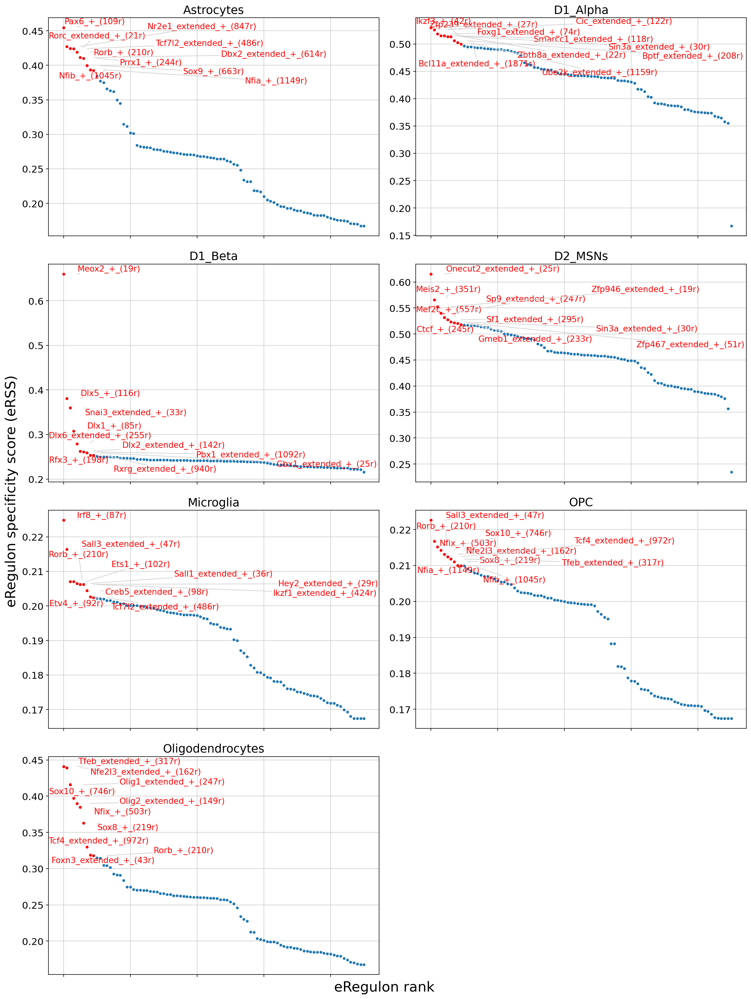

In [34]:
plot_rss(scplus_obj, 'Identities_filtered', num_columns=2, top_n=10, figsize = (15, 20))

# TF co-occupancy Jaccard heatmap

In [32]:
from scenicplus.RSS import *
regulon_specificity_scores(
        scplus_obj,
        variable = 'Identities',
        auc_key = 'eRegulon_AUC_filtered',
        signature_keys = ['Region_based'],
        selected_regulons = [x for x in scplus_obj.uns['selected_eRegulon']['Region_based'] if '-' not in x],
        out_key_suffix = '_filtered')

In [33]:
# select the top 10 eRegulons per cell type

flat_list = lambda t: [item for sublist in t for item in sublist]
selected_markers = list(set(flat_list(
    [scplus_obj.uns['RSS']['Identities_filtered'].loc[celltype].sort_values(ascending = False).head(10).index.to_list()
    for celltype in scplus_obj.uns['RSS']['Identities_filtered'].index])))

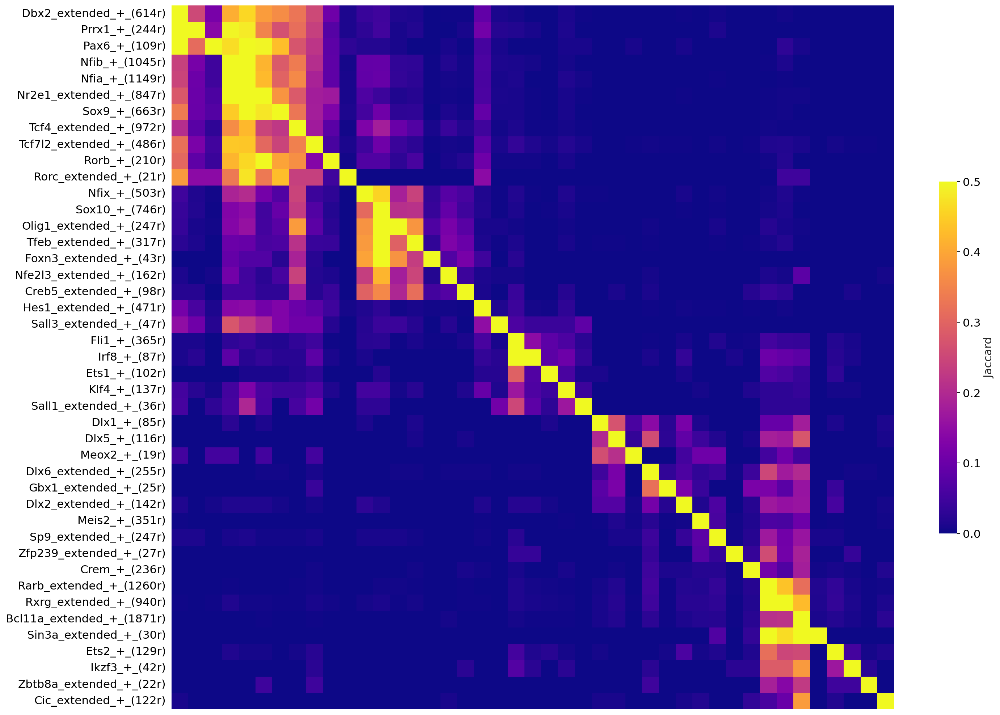

In [35]:
# plot heatmap

from scenicplus.plotting.correlation_plot import *

region_intersetc_data, Z = jaccard_heatmap(
        scplus_obj,
        method = 'intersect',
        gene_or_region_based = 'Region_based',
        use_plotly = False,
        selected_regulons = selected_markers,
        signature_key = 'eRegulon_signatures_filtered',
        figsize = (20, 16), return_data = True, vmax = 0.5, cmap = 'plasma')

# Manually edit cisTopic function for topic-cell probability UMAP (scroll up)
## https://github.com/aertslab/pycisTopic/blob/master/pycisTopic/clust_vis.py

In [27]:
def plot_cistopic_metadata_no_grid(
    cistopic_obj: "CistopicObject",
    reduction_name: str,
    variables: List[str],
    target: Optional[str] = "cell",
    remove_nan: Optional[bool] = True,
    show_label: Optional[bool] = True,
    show_legend: Optional[bool] = False,
    cmap: Optional[Union[str, "matplotlib.cm"]] = cm.viridis,
    dot_size: Optional[int] = 10,
    text_size: Optional[int] = 10,
    alpha: Optional[Union[float, int]] = 1,
    seed: Optional[int] = 555,
    color_dictionary: Optional[Dict[str, str]] = {},
    figsize: Optional[Tuple[float, float]] = (6.4, 4.8),
    num_columns: Optional[int] = 1,
    selected_features: Optional[List[str]] = None,
    save: Optional[str] = None,
):
    """
    Plot categorical and continuous metadata into dimensionality reduction.
    Parameters
    ---------
    cistopic_obj: `class::CistopicObject`
            A cisTopic object with dimensionality reductions in `class::CistopicObject.projections`.
    reduction_name: str
            Name of the dimensionality reduction to use
    variables: list
            List of variables to plot. They should be included in `class::CistopicObject.cell_data` and `class::CistopicObject.region_data`, depending on which
            target is specified.
    target: str, optional
            Whether cells ('cell') or regions ('region') should be used. Default: 'cell'
    remove_nan: bool, optional
            Whether to remove data points for which the variable value is 'nan'. Default: True
    show_label: bool, optional
            For categorical variables, whether to show the label in the plot. Default: True
    show_legend: bool, optional
            For categorical variables, whether to show the legend next to the plot. Default: False
    cmap: str or 'matplotlib.cm', optional
            For continuous variables, color map to use for the legend color bar. Default: cm.viridis
    dot_size: int, optional
            Dot size in the plot. Default: 10
    text_size: int, optional
            For categorical variables and if show_label is True, size of the labels in the plot. Default: 10
    alpha: float, optional
            Transparency value for the dots in the plot. Default: 1
    seed: int, optional
            Random seed used to select random colors. Default: 555
    color_dictionary: dict, optional
            A dictionary containing an entry per variable, whose values are dictionaries with variable levels as keys and corresponding colors as values.
            Default: None
    figsize: tuple, optional
            Size of the figure. If num_columns is 1, this is the size for each figure; if num_columns is above 1, this is the overall size of the figure (if keeping
            default, it will be the size of each subplot in the figure). Default: (6.4, 4.8)
    num_columns: int, optional
            For multiplot figures, indicates the number of columns (the number of rows will be automatically determined based on the number of plots). Default: 1
    selected_features: list, optional
            A list with selected features (cells or regions) to plot. This is recommended when working with regions (e.g. selecting
            regions in binarized topics), as working with all regions can be time consuming. Default: None (use all features)
    save: str, optional
            Path to save plot. Default: None.
    """
    if target == "cell":
        data_mat = cistopic_obj.cell_data
    if target == "region":
        data_mat = cistopic_obj.region_data

    embedding = cistopic_obj.projections[target][reduction_name]

    if selected_features is not None:
        data_mat = data_mat.loc[selected_features]
        embedding = embedding.loc[selected_features]

    data_mat = data_mat.loc[embedding.index.to_list()]
    pdf = None
    if (save is not None) & (num_columns == 1):
        pdf = matplotlib.backends.backend_pdf.PdfPages(save)

    if num_columns > 1:
        num_rows = int(np.ceil(len(variables) / num_columns))
        if figsize == (6.4, 4.8):
            figsize = (6.4 * num_columns, 4.8 * num_rows)
        i = 1

    fig = plt.figure(figsize=figsize)

    for var in variables:
        var_data = data_mat.copy().loc[:, var].dropna().to_list()
        if isinstance(var_data[0], str):
            if (remove_nan) & (data_mat[var].isnull().sum() > 0):
                var_data = data_mat.copy().loc[:, var].dropna().to_list()
                emb_nan = embedding.loc[
                    data_mat.copy().loc[:, var].dropna().index.tolist()
                ]
                label_pd = pd.concat(
                    [emb_nan, data_mat.loc[:, [var]].dropna()], axis=1, sort=False
                )
            else:
                var_data = (
                    data_mat.copy().astype(str).fillna("NA").loc[:, var].to_list()
                )
                label_pd = pd.concat(
                    [embedding, data_mat.astype(str).fillna("NA").loc[:, [var]]],
                    axis=1,
                    sort=False,
                )

            categories = set(var_data)
            try:
                color_dict = color_dictionary[var]
            except BaseException:
                random.seed(seed)
                color = list(
                    map(
                        lambda i: "#" + "%06x" % random.randint(0, 0xFFFFFF),
                        range(len(categories)),
                    )
                )
                color_dict = dict(zip(categories, color))

            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1

            if (remove_nan) & (data_mat[var].isnull().sum() > 0):
                plt.scatter(
                    emb_nan.iloc[:, 0],
                    emb_nan.iloc[:, 1],
                    c=data_mat.loc[:, var].dropna().apply(lambda x: color_dict[x]),
                    s=dot_size,
                    alpha=alpha,
                )
                plt.xlabel(emb_nan.columns[0])
                plt.ylabel(emb_nan.columns[1])
            else:
                plt.scatter(
                    embedding.iloc[:, 0],
                    embedding.iloc[:, 1],
                    c=data_mat.astype(str)
                    .fillna("NA")
                    .loc[:, var]
                    .apply(lambda x: color_dict[x]),
                    s=dot_size,
                    alpha=alpha,
                )
                plt.xlabel(embedding.columns[0])
                plt.ylabel(embedding.columns[1])
                plt.grid(visible=False)   # ADDED

            if show_label:
                label_pos = label_pd.groupby(var).agg(
                    {label_pd.columns[0]: np.mean, label_pd.columns[1]: np.mean}
                )
                texts = []
                for label in label_pos.index.tolist():
                    texts.append(
                        plt.text(
                            label_pos.loc[label][0],
                            label_pos.loc[label][1],
                            label,
                            horizontalalignment="center",
                            verticalalignment="center",
                            size=text_size,
                            weight="bold",
                            color=color_dict[label],
                            path_effects=[
                                PathEffects.withStroke(linewidth=3, foreground="w")
                            ],
                        )
                    )
                adjust_text(texts)

            plt.title(var)
            patchList = []
            for key in color_dict:
                data_key = mpatches.Patch(color=color_dict[key], label=key)
                patchList.append(data_key)
            if show_legend:
                plt.legend(
                    handles=patchList, bbox_to_anchor=(1.04, 1), loc="upper left"
                )

            if num_columns == 1:
                if save is not None:
                    pdf.savefig(fig, bbox_inches="tight")
                plt.show()
        else:
            var_data = data_mat.copy().loc[:, var].to_list()
            o = np.argsort(var_data)
            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1
            plt.scatter(
                embedding.iloc[o, 0],
                embedding.iloc[o, 1],
                c=subset_list(var_data, o),
                cmap=cmap,
                s=dot_size,
                alpha=alpha,
            )
            plt.xlabel(embedding.columns[0])
            plt.ylabel(embedding.columns[1])
            plt.title(var)
            # setup the colorbar
            normalize = mcolors.Normalize(
                vmin=np.array(var_data).min(), vmax=np.array(var_data).max()
            )
            scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
            scalarmappaple.set_array(var_data)
            plt.colorbar(scalarmappaple)
            if num_columns == 1:
                if save is not None:
                    pdf.savefig(fig, bbox_inches="tight")
                plt.show()
    
    
    if num_columns > 1:
        plt.tight_layout()
        if save is not None:
            fig.savefig(save, bbox_inches="tight")
        plt.show()
    if (save is not None) & (num_columns == 1):
        pdf = pdf.close()


In [21]:
from scenicplus.dimensionality_reduction import *
def plot_eRegulon_nogrid(scplus_obj: SCENICPLUS,
                  reduction_name: str,
                  auc_key: Optional[str] = 'eRegulon_AUC',
                  signature_keys: Optional[List[str]] = ['Gene_based', 'Region_based'],
                  normalize_tf_expression: Optional[bool] = True,
                  cmap: Optional[Union[str, 'matplotlib.cm']] = cm.viridis,
                  dot_size: Optional[int] = 10,
                  alpha: Optional[Union[float, int]] = 1,
                  scale: Optional[bool] = False,
                  selected_regulons: Optional[List[int]] = None,
                  selected_cells: Optional[List[str]] = None,
                  figsize: Optional[Tuple[float, float]] = (6.4, 4.8),
                  num_columns: Optional[int] = 3,
                  save: Optional[str] = None):
    """
    Plot TF expression and eRegulon AUC (gene and region based) into dimensionality reduction.

    Parameters
    ---------
    scplus_obj: `class::SCENICPLUS`
            A cisTopic object with dimensionality reductions in `class::CistopicObject.projections`.
    reduction_name: str
            Name of the dimensionality reduction to use
    auc_key: str, optional
            Key to extract AUC values from. Default: 'eRegulon_AUC'
    signature_keys: List, optional
            Keys to extract AUC values from. Default: ['Gene_based', 'Region_based'] 
    normalize_tf_expression: bool, optional
            Whether logCPM normalize TF expression. Default: True    
    cmap: str or 'matplotlib.cm', optional
            For continuous variables, color map to use for the legend color bar. Default: cm.viridis
    dot_size: int, optional
            Dot size in the plot. Default: 10
    alpha: float, optional
            Transparency value for the dots in the plot. Default: 1
    scale: bool, optional
            Whether to scale the cell-topic or topic-regions contributions prior to plotting. Default: False
    selected_regulons: list, optional
            A list with selected regulons to be used for clustering. Default: None (use all regulons)
    selected_cells: list, optional
            A list with selected features cells to cluster. Default: None (use all cells)
    figsize: tuple, optional
            Size of the figure. If num_columns is 1, this is the size for each figure; if num_columns is above 1, this is the overall size of the figure (if keeping
            default, it will be the size of each subplot in the figure). Default: (6.4, 4.8)
    num_columns: int, optional
            For multiplot figures, indicates the number of columns (the number of rows will be automatically determined based on the number of plots). Default: 1
    save: str, optional
            Path to save plot. Default: None.
    """

    embedding = scplus_obj.dr_cell[reduction_name].copy()

    if scale:
        data_mat = pd.concat([pd.DataFrame(sklearn.preprocessing.StandardScaler().fit_transform(
            scplus_obj.uns[auc_key][x].T), index=scplus_obj.uns[auc_key][x].T.index.to_list(), columns=scplus_obj.uns[auc_key][x].T.columns) for x in signature_keys])
    else:
        data_mat = pd.concat([scplus_obj.uns[auc_key][x]
                             for x in signature_keys]).T
    data_names = data_mat.columns.tolist()

    if selected_cells is not None:
        data_mat = data_mat[selected_cells]
        data_names = selected_cells

    if selected_regulons is None:
        selected_regulons = [x.rsplit('_', 1)[0] for x in data_mat.index]

    if (save is not None) & (num_columns == 1):
        pdf = matplotlib.backends.backend_pdf.PdfPages(save)

    if num_columns > 1:
        num_rows = int(np.ceil(len(selected_regulons)))
        if figsize == (6.4, 4.8):
            figsize = (6.4 * num_columns, 4.8 * num_rows)
        i = 1

    fig = plt.figure(figsize=figsize)

    dgem = pd.DataFrame(scplus_obj.X_EXP, index=scplus_obj.cell_names,
                        columns=scplus_obj.gene_names).copy()

    if normalize_tf_expression:
        dgem = dgem.T / dgem.T.sum(0) * 10**6
        dgem = np.log1p(dgem).T
    dgem = dgem.T
    data_mat = data_mat.T.fillna(0)
    for regulon in selected_regulons:
        tf_name = regulon.split('_')[0]
        regulon_names = data_mat.columns[data_mat.columns.str.contains(
            regulon + '_(', regex=False)]
        gene_based_name = regulon_names[regulon_names.str.contains(
            'g)', regex=False)]
        region_based_name = regulon_names[regulon_names.str.contains(
            'r)', regex=False)]
        if tf_name in dgem.index:
            # TF expression
            tf_expr = dgem.loc[tf_name]
            tf_expr = tf_expr.sort_values()
            embedding_plot = embedding.loc[tf_expr.index.tolist()]
            o = np.argsort(tf_expr)
            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1
            if not scale:
                plt.scatter(embedding_plot.iloc[o, 0], embedding_plot.iloc[o, 1], c=subset_list(
                    tf_expr, o), cmap=cmap, s=dot_size, alpha=alpha, vmin=0, vmax=max(tf_expr))
                normalize = mcolors.Normalize(
                    vmin=0, vmax=np.array(tf_expr).max())
            else:
                plt.scatter(embedding_plot.iloc[o, 0], embedding_plot.iloc[o, 1], c=subset_list(
                    tf_expr, o), cmap=cmap, s=dot_size, alpha=alpha)
                normalize = mcolors.Normalize(
                    vmin=np.array(tf_expr).min(),
                    vmax=np.array(tf_expr).max())
            plt.xlabel(embedding_plot.columns[0])
            plt.ylabel(embedding_plot.columns[1])
            plt.title(tf_name+'_expression')
            
            plt.grid(visible=False)   # ADDED
            
            
            # setup the colorbar
            scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
            scalarmappaple.set_array(tf_expr)
            plt.colorbar(scalarmappaple)
            if num_columns == 1:
                if save is not None:
                    pdf.savefig(fig, bbox_inches='tight')
                plt.show()
            # Gene data
            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1
            if 'Gene_based' in signature_keys:
                gene_data = data_mat[gene_based_name].squeeze()
                gene_data = gene_data.sort_values()
                embedding_plot = embedding.loc[gene_data.index.tolist()]
                o = np.argsort(gene_data)
                if not scale:
                    plt.scatter(embedding_plot.iloc[o, 0], embedding_plot.iloc[o, 1], c=subset_list(
                        gene_data, o), cmap=cmap, s=dot_size, alpha=alpha, vmin=0, vmax=max(gene_data))
                    normalize = mcolors.Normalize(
                        vmin=0, vmax=np.array(gene_data).max())
                else:
                    plt.scatter(embedding_plot.iloc[o, 0], embedding_plot.iloc[o, 1], c=subset_list(
                        gene_data, o), cmap=cmap, s=dot_size, alpha=alpha)
                    normalize = mcolors.Normalize(
                        vmin=np.array(gene_data).min(),
                        vmax=np.array(gene_data).max())
                plt.xlabel(embedding_plot.columns[0])
                plt.ylabel(embedding_plot.columns[1])
                plt.title(gene_based_name[0])
                
                plt.grid(visible=False)   # ADDED
                
                # setup the colorbar
                scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
                scalarmappaple.set_array(gene_data)
                plt.colorbar(scalarmappaple)
                if num_columns == 1:
                    if save is not None:
                        pdf.savefig(fig, bbox_inches='tight')
                    plt.show()
            else:
                plt.figure()
            # Region data
            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1
            if 'Region_based' in signature_keys:
                region_data = data_mat[region_based_name].squeeze()
                region_data = region_data.sort_values()
                embedding_plot = embedding.loc[region_data.index.tolist()]
                o = np.argsort(region_data)
                if not scale:
                    plt.scatter(embedding_plot.iloc[o, 0], embedding_plot.iloc[o, 1], c=subset_list(
                        region_data, o), cmap=cmap, s=dot_size, alpha=alpha, vmin=0, vmax=max(region_data))
                    normalize = mcolors.Normalize(
                        vmin=0, vmax=np.array(region_data).max())
                else:
                    plt.scatter(embedding_plot.iloc[o, 0], embedding_plot.iloc[o, 1], c=subset_list(
                        region_data, o), cmap=cmap, s=dot_size, alpha=alpha)
                    normalize = mcolors.Normalize(
                        vmin=np.array(region_data).min(),
                        vmax=np.array(region_data).max())
                plt.xlabel(embedding_plot.columns[0])
                plt.ylabel(embedding_plot.columns[1])
                plt.title(region_based_name[0])
                
                plt.grid(visible=False)   # ADDED
                
                # setup the colorbar
                scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
                scalarmappaple.set_array(region_data)
                plt.colorbar(scalarmappaple)
                if num_columns == 1:
                    if save is not None:
                        pdf.savefig(fig, bbox_inches='tight')
                    plt.show()
            else:
                plt.figure()

    if num_columns > 1:
        plt.tight_layout()
        if save is not None:
            fig.savefig(save, bbox_inches='tight')
        plt.show()

    if (save is not None) & (num_columns == 1):
        pdf.close()